In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import meanderpy as mp             
from importlib import reload
reload(mp)
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
mpl.rcParams['figure.dpi'] = 500
import scipy.stats as stats          
import seaborn as sns                   
from scipy import interpolate          
import random

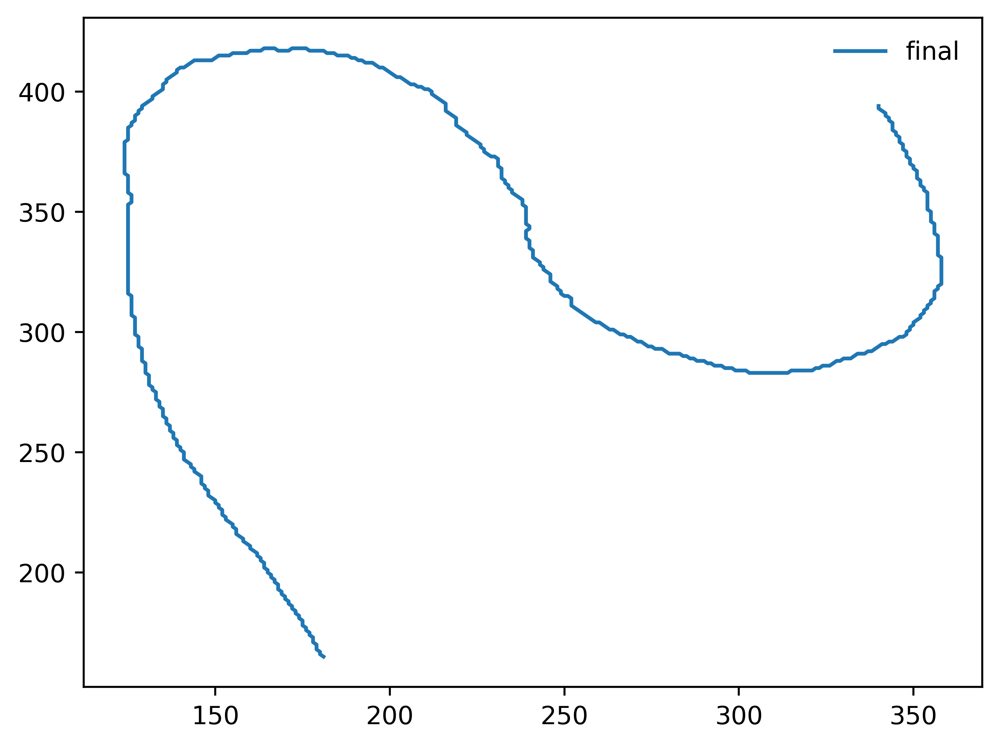

In [2]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('0.1.txt',delimiter=' ')
cl2=np.loadtxt('10.1.txt',delimiter=' ')

y = cl1[:,0][::-1]
x = cl1[:,1][::-1]
y1 = cl2[:,0][::-1]
x1= cl2[:,1][::-1]

plt.plot(x1,y1,label = 'final')
plt.legend(frameon=False)

100%|████████████████████████████████████████| 100/100 [00:00<00:00, 102.46it/s]

You are running this simulation for: 10.0 Years
Migration rate constant = 200.0 m/yr



/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/456633528.py:34: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  synx = 0.1*chb.channels[np.int(nit-1)].x
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/456633528.py:35: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your

<AxesSubplot:xlabel='x'>

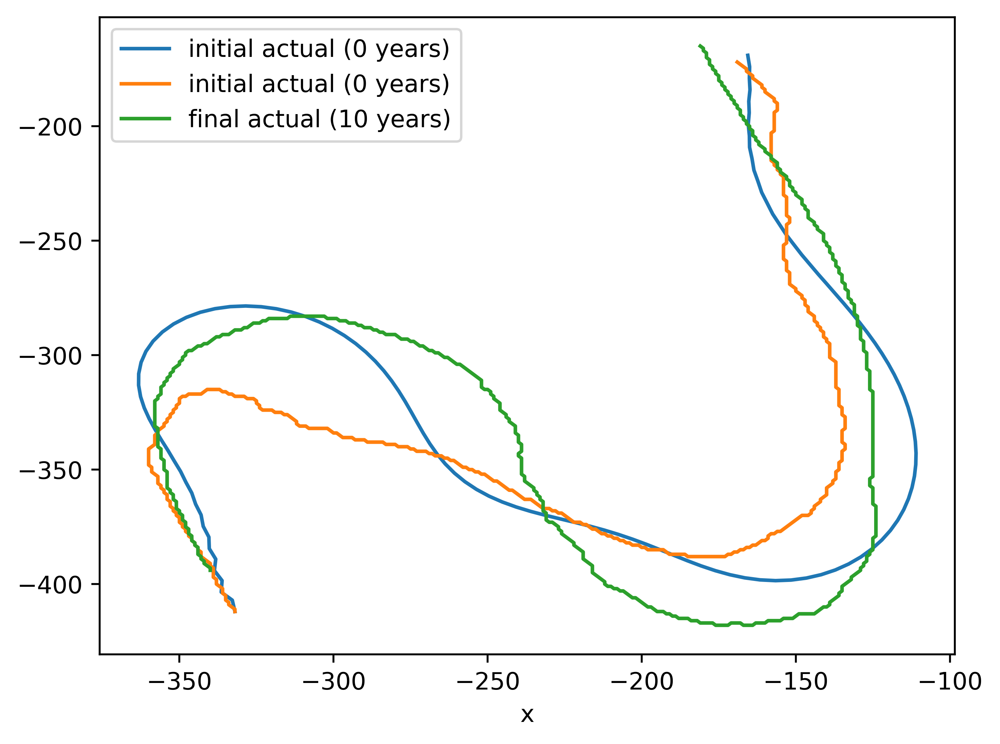

In [3]:
nit = 100                    # number of iterations
W = 100.0                    # channel width (m)
D = 10.0                      # channel depth (m)
depths = D * np.ones((nit,))  # channel depths for different iterations  
pad = 0# padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline           
Cfs = 0.02 * np.ones((nit,))
crdist = 1.8 * W               # threshold distance at which cutoffs occur
kl = 200/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0e-12               # vertical slope-dependent erosion rate constant (m/s)
dt = 0.1*(365*24*60*60.0)      # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 1                # which time steps will be saved
Sl = 0.0                     # initial slope (matters more for submarine channels than rivers)
t1 = 0                    # time step when incision starts
t2 = 0                    # time step when lateral migration starts
t3 = 0     
aggr_factor = 2e-9            # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)
sc = 1.0
y=cl1[:,0]*10
x=cl1[:,1]*10
z=np.zeros(len(x))
H=depths[0]

ch=mp.Channel(-x,-y,z,W,H)
chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
channel_coordinate = pd.DataFrame({"x":chb.channels[nit-1].x, "y":chb.channels[nit-1].y, "Z":chb.channels[nit-1].z}) # the way it work is this: chb.channels[i].x will give you the x coordinates for the ith time step
np.savetxt('output.txt', channel_coordinate, delimiter=',')

print('You are running this simulation for:', nit*dt/(365.*24*60*60),'Years')
print('Migration rate constant =', kl*60*60.*24.*365., 'm/yr')

synx = 0.1*chb.channels[np.int(nit-1)].x
syny = 0.1*chb.channels[np.int(nit-1)].y

np.savetxt('syn.txt', np.c_[syny,synx])
clsyn=np.loadtxt('syn.txt',delimiter=' ')
ax = pd.DataFrame({"x":clsyn[:,1], "y":clsyn[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)')
pd.DataFrame({"x":-cl1[:,1], "y":-cl1[:,0]}).plot.line(x='x', y='y', ax= ax, label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1], "y":-cl2[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (10 years)')

In [4]:
t = np.linspace(0,1,np.shape(cl1[:,])[0]) # create a new variable t 
x_o = -cl1[:,1].flatten()            # get x-axis data
y_o = -cl1[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)   
xnew_o = fx_o(tnew) + np.random.normal(0,0.1,1000)  # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.1,1000)# create a finer t-variable spacing 
xnew_o = fx_o(tnew)   # get interpolated x values
ynew_o = fy_o(tnew)   # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 2) 
#data_obs_ins =np.flip(data_obs_ins, axis=1)

t = np.linspace(0,1,np.shape(cl2[:,])[0]) # create a new variable t 
x_o = -cl2[:,1].flatten()            # get x-axis data
y_o = -cl2[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)           # create a finer t-variable spacing 
xnew_o = fx_o(tnew)                     # get interpolated x values
ynew_o = fy_o(tnew)
data_obs = np.array([xnew_o,ynew_o])
data_obs = np.flip(data_obs, axis=1)
data_obs = np.round(data_obs, 1)
# modelled

t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
x_m = 0.1*chb.channels[np.int(nit-1)].x
y_m = 0.1*chb.channels[np.int(nit-1)].y
fx_m = interpolate.interp1d(t,x_m)
fy_m = interpolate.interp1d(t, y_m)
tnew = np.linspace(0,1,1000)
xnew_m = fx_m(tnew)
ynew_m = fy_m(tnew)
ynew_ms = ynew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
xnew_ms = xnew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
ynew_ms = ynew_m
xnew_ms = xnew_m

/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/458386601.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/458386601.py:29: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. 

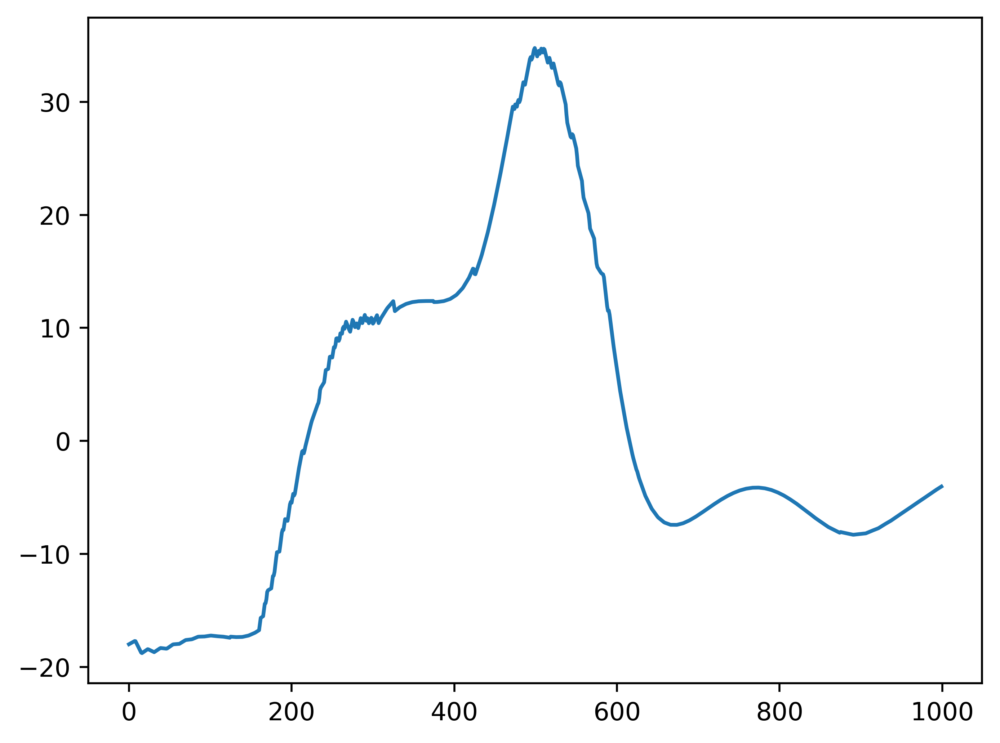

In [5]:
data_obs =np.flip(data_obs, axis=1)
err1 = data_obs_ins[0,:] - data_obs[0,:]
err2 = xnew_ms - data_obs[0,:]
plt.plot(ynew_ms - data_obs[1,:])

In [6]:
nit = 100                   
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0      

def hkm(parm):  
    kl =  (parm[0]*10)/(365*24*60*60.0)  
    Cfs = parm[1] * 0.001 * np.ones((nit,))
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]

    try:    
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = 0.1*chb.channels[np.int(nit-1)].x
            y_m = 0.1*chb.channels[np.int(nit-1)].y

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,1000)
            xnew_m = fx_m(tnew) 
            ynew_m = fy_m(tnew) 
            xnew_m[:] = xnew_m[::-1] 
            ynew_m[:] = ynew_m[::-1] 
        
        else:
            t = np.linspace(0,1,1000)
            xnew_m = np.zeros(1000) 
            ynew_m = np.zeros(1000) 
            ynew_m[:] = ynew_m[::-1] 
            xnew_m[:] = xnew_m[::-1] 

    except:
        t = np.linspace(0,1,1000)
        xnew_m = np.zeros(1000) 
        ynew_m = np.zeros(1000) 
        ynew_m[:] = ynew_m[::-1] 
        xnew_m[:] = xnew_m[::-1] 
        
    return np.array([xnew_m,ynew_m])

[15 20  1]
[15 20  1]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.59it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

-4700.066889149197

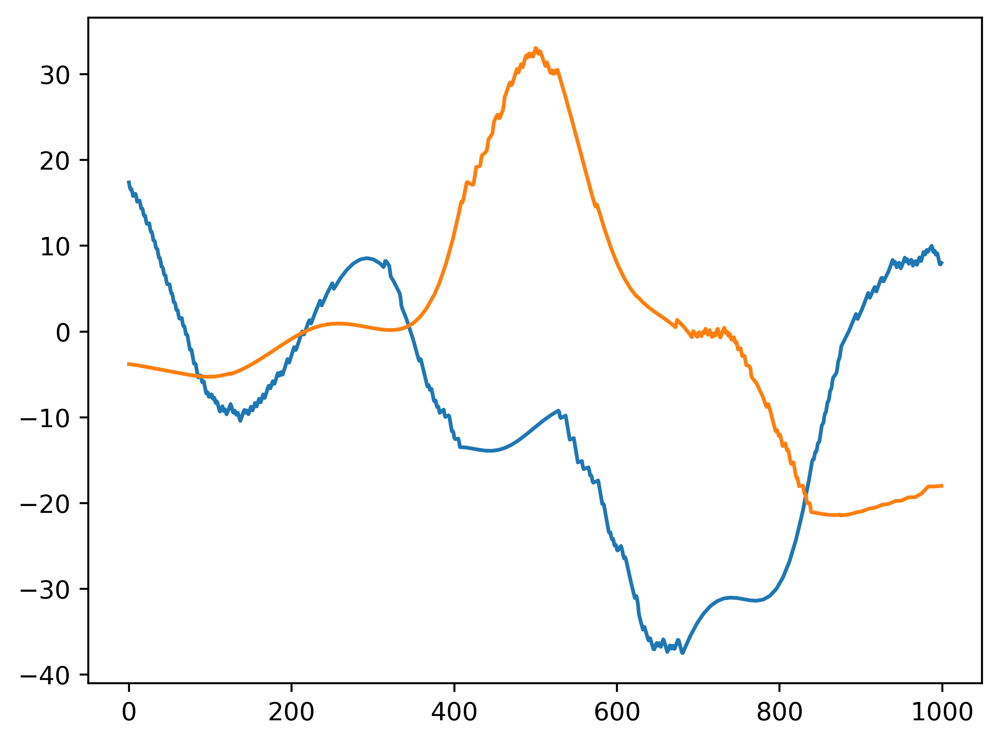

In [7]:
def log_prior(par):
    
    if  10 < par[0] < 50 and 0 < par[1] < 30 and 0.01 < par[2] < 10:   # define the bounds of the prior   
        return -par[2]/1                           # return the exponential distribution
    else:
        return -np.inf
    
def log_lik(par,data):
    print(par)
    sim = hkm(parm=par[:2])
    
    x_err = sim[0,:]-data[0,:][::-1]
    y_err = sim[1,:]-data[1,:][::-1]
    plt.plot(x_err) 
    plt.plot(y_err) 

    y_fft = np.fft.fft(y_err)  # do the fast fourier transform of y-errrors
    x_fft = np.fft.fft(x_err)  # do the fast fourier transform of x-errrors
    
    y_amp1 = 2*abs(y_fft.real/y_fft.size)      # retrieve amplitude of cos function
    y_amp2 = 2*abs(y_fft.imag/y_fft.size)      # retrieve amplitude of sin function
    x_amp1 = 2*abs(x_fft.real/x_fft.size)      # retrieve amplitude of cos function
    x_amp2 = 2*abs(x_fft.imag/x_fft.size)      # retrieve amplitude of sin function
    
    amp = np.array([y_amp1,y_amp2,x_amp1,x_amp2]) # write all four amplitudes in one array 
    
    return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array

def log_post(par, data):
    par = np.around(par, decimals = 0)
    print (par)
    if (log_prior(par)==-np.inf):
        lp = log_prior(par)
    else: 
        lp = log_lik(par,data)+ log_prior(par)
    return lp  

#Test Run
log_post([15,20 ,1],data_obs)

In [8]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=10, sd=15, low=0, upp=50)
X2 = get_truncated_normal(mean=5, sd=10, low=0, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

In [9]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=15, sd=10, low=1, upp=40)
X2 = get_truncated_normal(mean=10, sd=10, low=1, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.89it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

[2. 7. 3.]
[ 4. 14.  3.]
[12.  3.  2.]
[12.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 758.35it/s]


[18.  4.  3.]
[18.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.49it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.29it/s]


[3. 7. 3.]
[36.  6.  4.]
[36.  6.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 748.41it/s]


[18.  2.  1.]
[18.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.98it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.92it/s]


[19.  2.  2.]
[19.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.43it/s]


[22.  3.  4.]
[22.  3.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.31it/s]


[17.  7.  3.]
[17.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.31it/s]


[17. 18.  1.]
[17. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.09it/s]


[11.  4.  3.]
[11.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 755.32it/s]


[6. 6. 1.]
[36.  9.  2.]
[36.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 736.88it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/3400913311.py:27: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.36it/s]


[28. 11.  2.]
[28. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.90it/s]


[30. 14.  2.]
[30. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.06it/s]


[10. 12.  2.]
[1. 9. 2.]
[15.  5.  3.]
[15.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 747.59it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.23it/s]


[ 8. 19.  2.]
[31.  8.  2.]
[31.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 553.17it/s]


[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.90it/s]


[ 8. 15.  2.]
[18.  5.  2.]
[18.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.90it/s]


[12.  5.  2.]
[12.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.46it/s]


[9. 8. 2.]
[ 5. 16.  2.]
[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.41it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.85it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.77it/s]


[ 4. 10.  2.]
[10.  9.  2.]
[9. 2. 3.]
[25.  2.  5.]
[25.  2.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.70it/s]


[9. 9. 2.]
[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.68it/s]


[18.  7.  1.]
[18.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.81it/s]


[15. 14.  4.]
[15. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.04it/s]


[17.  5.  2.]
[17.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.10it/s]


[ 7. 10.  2.]
[15.  3.  2.]
[15.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.14it/s]


[6. 8. 4.]
[11. 13.  2.]
[11. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.65it/s]


[13. 18.  3.]
[13. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.17it/s]


[11.  4.  1.]
[11.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 859.22it/s]


[-7.  2.  4.]
[16.  4.  3.]
[16.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.18it/s]


[20.  2.  2.]
[20.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 865.91it/s]


[23.  3.  5.]
[23.  3.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 858.23it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.57it/s]


[7. 9. 1.]
[51.  7.  2.]
[31. 19.  2.]
[31. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.73it/s]


[42. 16.  3.]
[42. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.78it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.22it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.49it/s]


[49.  8.  2.]
[49.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 423.59it/s]


[12.  3.  2.]
[12.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 858.00it/s]


[21.  7.  3.]
[21.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.70it/s]


[ 7. 14.  2.]
[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.81it/s]


[-1.  8.  2.]
[8. 5. 3.]
[9. 4. 3.]
[25.  2.  5.]
[25.  2.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.29it/s]


[10.  8.  2.]
[23.  6.  1.]
[23.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.00it/s]


[26. -1.  2.]
[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.09it/s]


[11.  3.  1.]
[11.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 861.69it/s]
/Users/braydennoh/opt/anaconda3/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


[33.  9.  3.]
[33.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.28it/s]


[ 9. 14.  3.]
[14. -3.  2.]
[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.16it/s]


[ 7. 10.  3.]
[29.  4.  4.]
[29.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.41it/s]


[18. -3.  1.]
[25. 16.  3.]
[25. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.58it/s]


[18.  5.  2.]
[18.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.23it/s]


[12.  6.  3.]
[12.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.57it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.99it/s]


[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.46it/s]


[-4.  7.  2.]
[15.  6.  3.]
[15.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.55it/s]


[13. 19.  3.]
[13. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.49it/s]


[10. 18.  2.]
[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.86it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.17it/s]


[13.  9.  1.]
[13.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.20it/s]


[23.  4.  3.]
[23.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 863.24it/s]


[11. 16.  4.]
[11. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.02it/s]


[ 9.  8. -2.]
[3. 9. 1.]
[ 2. 10.  4.]
[ 7. 29.  2.]
[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.39it/s]


[ 3. 14.  3.]
[10.  4.  2.]
[16.  4.  3.]
[16.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.74it/s]


[5. 8. 3.]
[28.  4.  4.]
[28.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.28it/s]


[17.  1.  1.]
[17.  1.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 864.68it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.35it/s]


[11.  6.  3.]
[11.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.50it/s]


[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.49it/s]


[31.  9.  2.]
[31.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.51it/s]


[-9.  3.  1.]
[12.  4.  3.]
[12.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 858.46it/s]


[34. 11.  0.]
[11.  5.  2.]
[11.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.69it/s]


[24.  1.  4.]
[24.  1.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 880.72it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.79it/s]


[ 13. -11.   4.]
[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.28it/s]


[31.  2.  3.]
[31.  2.  3.]


  0%|                                                   | 0/100 [00:00<?, ?it/s]/Users/braydennoh/opt/anaconda3/lib/python3.9/site-packages/meanderpy/meanderpy.py:534: RuntimeWarning: invalid value encountered in double_scalars
  R1 = sinuosity**(-2/3.0)*R1
  6%|██▌                                        | 6/100 [00:00<00:03, 24.30it/s]


[12. 15.  4.]
[12. 15.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.06it/s]


[15.  7.  2.]
[15.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.25it/s]


[6. 6. 4.]
[10. 12.  2.]
[14.  7.  2.]
[14.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.74it/s]


[3. 7. 3.]
[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.59it/s]


[27. -2.  2.]
[23.  3.  4.]
[23.  3.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 864.27it/s]


[19.  6.  3.]
[19.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.54it/s]


[13. 23.  0.]
[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.33it/s]


[32. 11.  2.]
[32. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.90it/s]


[53. 19.  1.]
[11.  8.  3.]
[11.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.99it/s]


[10. 19.  2.]
[22. 24.  3.]
[22. 24.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.27it/s]


[13. 23.  2.]
[13. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.84it/s]


[ 9. 10.  2.]
[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.82it/s]


[ 5. 17.  2.]
[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.34it/s]


[15.  8.  2.]
[15.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.92it/s]


[ 4. 10.  2.]
[10.  8.  2.]
[27. -1.  6.]
[19.  6.  1.]
[19.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.14it/s]


[17.  5.  1.]
[17.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.69it/s]


[10.  8.  2.]
[14. 13.  3.]
[14. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.06it/s]


[28. 11.  2.]
[28. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.24it/s]


[-5.  9.  2.]
[14.  4.  2.]
[14.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.33it/s]


[ 6. 21. -2.]
[6. 9. 3.]
[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.26it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.03it/s]


[12.  7.  3.]
[12.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.89it/s]


[13.  5.  2.]
[13.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.47it/s]


[31. 11.  2.]
[31. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.05it/s]


[41. 22.  2.]
[41. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 744.60it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.64it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.50it/s]


[7. 4. 2.]
[22.  7.  3.]
[22.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.65it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.35it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.38it/s]


[-4.  6.  3.]
[27.  1.  5.]
[27.  1.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.45it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.41it/s]


[18.  7.  1.]
[18.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.35it/s]


[13. 25.  5.]
[13. 25.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.21it/s]


[ 8. 10.  3.]
[14. 17.  1.]
[14. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.79it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.54it/s]


[ 3. 14.  3.]
[10.  6.  3.]
[30.  5.  4.]
[30.  5.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.03it/s]


[19. -2.  1.]
[21.  2.  2.]
[21.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.80it/s]


[34. -1.  6.]
[15.  6.  2.]
[15.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 739.66it/s]


[40.  8.  2.]
[40.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.67it/s]


[20. 15.  3.]
[20. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.39it/s]


[-0. 15.  0.]
[5. 9. 2.]
[15.  6.  3.]
[15.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.40it/s]


[15. 17.  3.]
[15. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.22it/s]


[49.  8.  0.]
[-10.  16.   2.]
[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.85it/s]


[-5. 18.  3.]
[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 745.21it/s]


[10.  8.  2.]
[8. 1. 3.]
[26.  2.  2.]
[26.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.55it/s]


[19.  1.  0.]
[ 9. 10.  2.]
[10.  7.  3.]
[12.  7.  2.]
[12.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.15it/s]


[ 9. 12.  3.]
[20.  2.  3.]
[20.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 766.60it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.95it/s]


[33.  4.  4.]
[33.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.41it/s]


[20.  4.  2.]
[20.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.54it/s]


[17.  0.  2.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.01it/s]


[16.  7.  3.]
[16.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.37it/s]


[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.92it/s]


[36. 13.  3.]
[36. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 752.18it/s]


[-4.  9.  2.]
[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.18it/s]


[21. 17.  3.]
[21. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.79it/s]


[32. 10.  1.]
[32. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.76it/s]


[16. 21.  2.]
[16. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.53it/s]


[10. 14.  2.]
[21.  9.  2.]
[21.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.47it/s]


[11.  7.  2.]
[11.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.69it/s]


[ 6. 19.  2.]
[ 1. 12.  2.]
[13.  6.  2.]
[13.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.17it/s]


[-15.   8.   5.]
[17. 27. -0.]
[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.33it/s]


[11.  2.  1.]
[11.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 863.87it/s]


[38. 11.  2.]
[38. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 759.04it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.92it/s]


[9. 3. 2.]
[-1.  9.  4.]
[19. -1.  1.]
[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.64it/s]


[23.  3.  4.]
[23.  3.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 866.65it/s]


[37.  9.  2.]
[37.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.52it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.45it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.43it/s]


[11.  8.  3.]
[11.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.85it/s]


[12.  7.  3.]
[12.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.59it/s]


[19.  7.  3.]
[19.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.21it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.45it/s]


[10. 13.  3.]
[ 7. 10.  1.]
[ 4. 10.  2.]
[ 6. 12.  1.]
[10.  4.  3.]
[25.  2.  5.]
[25.  2.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.54it/s]


[10. 11.  2.]
[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.27it/s]


[18.  5.  1.]
[18.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.24it/s]


[15. 13.  3.]
[15. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.29it/s]


[17.  5.  1.]
[17.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.04it/s]


[36.  8.  2.]
[36.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.16it/s]


[ 0. 15.  3.]
[16.  4.  3.]
[16.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.70it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.10it/s]


[49.  1.  5.]
[49.  1.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 290.98it/s]


[16. -9.  1.]
[24.  2.  2.]
[24.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 877.62it/s]


[21. 24.  1.]
[21. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.71it/s]


[14.  5.  2.]
[14.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.34it/s]


[13.  8.  3.]
[13.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.34it/s]


[0. 9. 2.]
[13.  5.  3.]
[13.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.25it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.85it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.62it/s]


[28.  8.  2.]
[28.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.16it/s]


[ 6. 18.  2.]
[14. 15.  1.]
[14. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.56it/s]


[12. 17.  3.]
[12. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.57it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.15it/s]


[10. -5.  4.]
[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.50it/s]


[19.  4.  0.]
[-7.  7.  5.]
[12. 23.  1.]
[12. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.54it/s]


[11.  2.  1.]
[11.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 861.93it/s]


[11.  8.  3.]
[11.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.77it/s]


[14.  4.  2.]
[14.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 863.08it/s]


[4. 9. 3.]
[15.  9.  3.]
[15.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.77it/s]


[23.  2.  4.]
[23.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 867.62it/s]


[9. 6. 2.]
[9. 2. 3.]
[39.  8.  2.]
[39.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 255.52it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.54it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.41it/s]


[33. 14.  2.]
[33. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.01it/s]


[13. 13.  3.]
[13. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.00it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.48it/s]


[13.  9.  1.]
[13.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.13it/s]


[20.  5.  3.]
[20.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.69it/s]


[ 4. 23.  1.]
[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.78it/s]


[10.  8.  2.]
[25.  2.  5.]
[25.  2.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.56it/s]


[12. 13.  2.]
[12. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.91it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.46it/s]


[15. 13.  5.]
[15. 13.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.32it/s]


[ 5. 10.  1.]
[-0.  9.  1.]
[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.87it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.92it/s]


[14.  3.  2.]
[14.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.74it/s]


[11. 20. -1.]
[33.  4.  4.]
[33.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.52it/s]


[15.  5.  2.]
[15.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.88it/s]


[ 6. 21.  1.]
[8. 7. 2.]
[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.51it/s]


[34. 15.  2.]
[34. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.49it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.74it/s]


[12.  4.  3.]
[12.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.98it/s]


[39.  8.  1.]
[39.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 255.25it/s]


[17.  5.  2.]
[17.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.25it/s]


[19.  8.  3.]
[19.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.40it/s]


[ 2. 17.  3.]
[ 8. 11.  2.]
[4. 2. 4.]
[28. -0.  6.]
[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.15it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.54it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.38it/s]


[5. 9. 2.]
[17.  6.  2.]
[17.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.43it/s]


[-2. 16.  3.]
[12.  3.  1.]
[12.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.60it/s]


[21. 10.  2.]
[21. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.31it/s]


[-2. 16.  4.]
[7. 6. 2.]
[2. 0. 4.]
[22. -2.  1.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 733.27it/s]


[23.  5.  2.]
[23.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.99it/s]


[22.  4.  4.]
[22.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.24it/s]


[11.  3.  3.]
[11.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.52it/s]


[40.  7.  2.]
[40.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.10it/s]


[28. 11.  2.]
[28. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.56it/s]


[-14.   3.   2.]
[14. 19.  1.]
[14. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.84it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.80it/s]


[16. 23.  2.]
[16. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.47it/s]


[ 9. 15.  2.]
[13. 12. -0.]
[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.02it/s]


[10. 14.  3.]
[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 728.20it/s]


[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 742.32it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.53it/s]


[21.  5. -0.]
[ 4. 10.  4.]
[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.40it/s]


[33. 13.  2.]
[33. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.80it/s]


[ 4. 14.  3.]
[11.  3.  3.]
[11.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.31it/s]


[15.  5.  3.]
[15.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.30it/s]


[47. -0.  6.]
[18. 21.  2.]
[18. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.37it/s]


[21.  4.  2.]
[21.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.13it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 752.06it/s]


[10.  5.  2.]
[32.  7.  2.]
[32.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.10it/s]


[12. 10.  3.]
[12. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.38it/s]


[-1.  9.  2.]
[12.  7.  3.]
[12.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.65it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.25it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.77it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.83it/s]


[ 7. 25.  1.]
[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.24it/s]


[18.  7.  3.]
[18.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.43it/s]


[ 5. 15.  2.]
[ 2. 19.  1.]
[ 8. 12.  3.]
[28. -0.  6.]
[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.26it/s]


[12. 18.  3.]
[12. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.49it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.34it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.98it/s]


[-1.  9.  3.]
[17.  2.  1.]
[17.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 866.37it/s]


[18.  7.  3.]
[18.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.45it/s]


[14.  6.  2.]
[14.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.85it/s]


[13.  6.  3.]
[13.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.45it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.19it/s]


[40. 13.  3.]
[40. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.22it/s]


[40. 18.  2.]
[40. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.10it/s]


[14. 17.  1.]
[14. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.73it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.56it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.71it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.85it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.09it/s]


[7. 2. 3.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.83it/s]


[30.  4.  3.]
[30.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.42it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.34it/s]


[17. 12.  5.]
[17. 12.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.27it/s]


[16.  4. -0.]
[ 9. 10.  2.]
[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.45it/s]


[7. 9. 3.]
[12.  4.  2.]
[12.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.64it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.12it/s]


[15.  5.  2.]
[15.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.90it/s]


[-7.  6.  4.]
[28.  4.  4.]
[28.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.39it/s]


[21.  6.  2.]
[21.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.94it/s]


[9. 6. 3.]
[9. 6. 1.]
[47.  6.  2.]
[47.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.54it/s]


[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.44it/s]


[12. 13.  3.]
[12. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.75it/s]


[-10.   8.   2.]
[14.  7.  3.]
[14.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.99it/s]


[16. 18.  1.]
[16. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.58it/s]


[20.  6.  2.]
[20.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.06it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.49it/s]


[16. 23.  1.]
[16. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.54it/s]


[14. 15.  3.]
[14. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.51it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.35it/s]


[13. -8.  3.]
[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.93it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.25it/s]


[ 9. 10.  1.]
[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.13it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.25it/s]


[11.  2.  1.]
[11.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 862.11it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.19it/s]


[-4. 17.  5.]
[19.  2.  2.]
[19.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.04it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.14it/s]


[17.  4.  1.]
[17.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 859.80it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.84it/s]


[22.  7.  4.]
[22.  7.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.06it/s]


[13.  2.  2.]
[13.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.13it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.06it/s]


[32. 11.  2.]
[32. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.39it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.98it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.75it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.64it/s]


[10. 14.  2.]
[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.00it/s]


[20.  8.  3.]
[20.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.14it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.78it/s]


[11. 10.  1.]
[11. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.90it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.31it/s]


[28.  0.  6.]
[23. 17.  3.]
[23. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.62it/s]


[31.  4.  2.]
[31.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.76it/s]


[17.  7.  1.]
[17.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.96it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.45it/s]


[4. 7. 4.]
[16.  5.  2.]
[16.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.88it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.13it/s]


[4. 8. 3.]
[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.94it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.74it/s]


[17.  6.  3.]
[17.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.70it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.22it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.62it/s]


[11.  5.  3.]
[11.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.58it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.42it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.22it/s]


[35. 15.  2.]
[35. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.18it/s]


[-14.   9.   2.]
[20.  7.  3.]
[20.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.30it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.16it/s]


[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.24it/s]


[ 7. 15.  2.]
[11. 10.  0.]
[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.77it/s]


[11. 10.  1.]
[11. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.32it/s]


[ 9. 10.  2.]
[17.  8.  3.]
[17.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.06it/s]


[18.  7.  1.]
[18.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.39it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.14it/s]


[14.  7.  2.]
[14.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.15it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.06it/s]


[21.  3.  3.]
[21.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.59it/s]


[-2. 16.  4.]
[ 1. -3.  3.]
[22.  8.  2.]
[22.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.23it/s]


[21.  6.  2.]
[21.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.31it/s]


[9. 4. 2.]
[65.  4.  3.]
[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.98it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 766.99it/s]


[ 2. 19.  1.]
[18.  8.  3.]
[18.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.52it/s]


[22.  8.  3.]
[22.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.48it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.44it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.02it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.09it/s]


[-1. -3.  3.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.57it/s]


[28.  1.  3.]
[28.  1.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.35it/s]


[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.39it/s]


[19.  7. -1.]
[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.77it/s]


[4. 9. 4.]
[ 9. 10.  2.]
[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.11it/s]


[37. 13.  2.]
[37. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 186.15it/s]


[17.  3.  2.]
[17.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.77it/s]


[-3.  8.  4.]
[21.  6.  2.]
[21.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.02it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.60it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.91it/s]


[-3.  7.  3.]
[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.10it/s]


[34. 11.  2.]
[34. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 771.83it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.61it/s]


[ 7. 10.  2.]
[14. 18.  2.]
[14. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.04it/s]


[19.  5.  2.]
[19.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.92it/s]


[13. 13. -1.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.05it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.63it/s]


[15. 18.  2.]
[15. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.37it/s]


[11. 10.  1.]
[11. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.14it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.42it/s]


[14.  7.  1.]
[14.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.19it/s]


[18.  8.  4.]
[18.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.01it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.58it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.67it/s]


[19.  8.  1.]
[19.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.19it/s]


[24. -0. -0.]
[29.  9.  3.]
[29.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.18it/s]


[-1. 13.  4.]
[15.  5.  2.]
[15.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.30it/s]


[12. 18.  0.]
[21.  9.  3.]
[21.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.82it/s]


[23.  8.  2.]
[23.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.06it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.44it/s]


[18.  8.  3.]
[18.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.46it/s]


[12.  6.  2.]
[12.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.07it/s]


[36.  8.  2.]
[36.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.22it/s]


[38. 15.  2.]
[38. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.83it/s]


[13.  7.  3.]
[13.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.54it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.09it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.78it/s]


[ 4. 18.  2.]
[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.42it/s]


[22.  6.  4.]
[22.  6.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.17it/s]


[18.  7.  3.]
[18.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.27it/s]


[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.61it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.55it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.31it/s]


[ 9. 10.  3.]
[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.08it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.02it/s]


[14.  5.  2.]
[14.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.36it/s]


[20.  3.  3.]
[20.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.82it/s]


[ 7. 15.  3.]
[14.  6.  2.]
[14.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.45it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.26it/s]


[11.  5.  4.]
[11.  5.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.35it/s]


[10.  8.  3.]
[32. 10.  2.]
[32. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.97it/s]


[ 2. 13.  2.]
[15. 15.  3.]
[15. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.28it/s]


[ 4. 10.  2.]
[14.  7.  3.]
[14.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.80it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.37it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.31it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.04it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.44it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.61it/s]


[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.57it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.53it/s]


[14.  7.  1.]
[14.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.28it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.29it/s]


[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.91it/s]


[14.  6.  1.]
[14.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.78it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.01it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.41it/s]


[ 6. 16. -1.]
[35. 11.  2.]
[35. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.84it/s]


[15.  5.  2.]
[15.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.18it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.97it/s]


[3. 8. 3.]
[19.  8.  3.]
[19.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.72it/s]


[19.  3.  1.]
[19.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.71it/s]


[25.  3.  3.]
[25.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.98it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.79it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.46it/s]


[17.  6.  2.]
[17.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 859.62it/s]


[35. 12.  2.]
[35. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.57it/s]


[50. 18.  3.]
[16. 28.  0.]
[21. 13.  3.]
[21. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.84it/s]


[ 0. 17.  2.]
[16.  7.  3.]
[16.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.02it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.37it/s]


[27. 21.  1.]
[27. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.65it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.09it/s]


[16.  8.  3.]
[16.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.10it/s]


[19.  4.  1.]
[19.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 861.31it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.99it/s]


[8. 8. 3.]
[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.20it/s]


[11.  4.  1.]
[11.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.20it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.84it/s]


[13.  8.  2.]
[13.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.83it/s]


[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.82it/s]


[16.  6.  2.]
[16.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.93it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.43it/s]


[6. 7. 3.]
[22.  5.  2.]
[22.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.30it/s]


[13. 15.  1.]
[13. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.81it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.48it/s]


[10.  7.  3.]
[42.  7.  2.]
[42.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 754.30it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.51it/s]


[10. 12.  2.]
[-9. 10.  1.]
[13.  4.  3.]
[13.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 858.45it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.57it/s]


[ 2. 16.  2.]
[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.84it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.56it/s]


[27. 18.  0.]
[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.73it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.11it/s]


[12. 15.  0.]
[24. 15.  2.]
[24. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.09it/s]


[10.  3.  1.]
[14.  4.  2.]
[14.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 754.04it/s]


[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.55it/s]


[16.  4.  1.]
[16.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.71it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.93it/s]


[20.  8.  3.]
[20.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.54it/s]


[28. 14.  2.]
[28. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.89it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.12it/s]


[33. 14.  2.]
[33. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.48it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.64it/s]


[25. 20.  3.]
[25. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.39it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.01it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 752.85it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 726.18it/s]


[19.  7.  3.]
[19.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.18it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.79it/s]


[14. 17.  0.]
[ 5. 12.  0.]
[13.  5.  1.]
[13.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.08it/s]


[11.  9.  2.]
[11.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.56it/s]


[16.  7.  4.]
[16.  7.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.25it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.80it/s]


[19.  8.  1.]
[19.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.62it/s]


[14. 16.  1.]
[14. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.56it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.38it/s]


[6. 9. 4.]
[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.79it/s]


[13.  5.  0.]
[2. 7. 3.]
[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.84it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.97it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.95it/s]


[11.  6.  3.]
[11.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.12it/s]


[50.  1.  2.]
[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.97it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.27it/s]


[-10.   8.   2.]
[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.98it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.96it/s]


[12. 11.  0.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.54it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.83it/s]


[14.  8.  1.]
[14.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 769.65it/s]


[16.  6.  4.]
[16.  6.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.24it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.30it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.21it/s]


[16.  6.  1.]
[16.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.28it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.58it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.33it/s]


[3. 8. 4.]
[10.  2.  1.]
[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.60it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.60it/s]


[15.  6.  2.]
[15.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.93it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.12it/s]


[17.  4.  1.]
[17.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 855.24it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.01it/s]


[22.  5.  3.]
[22.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.20it/s]


[26. 14.  2.]
[26. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.52it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.93it/s]


[38. 14.  2.]
[38. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.80it/s]


[39. 16.  2.]
[39. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.16it/s]


[13.  7.  3.]
[13.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.66it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.72it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.56it/s]


[ 8. 14.  2.]
[18.  9.  3.]
[18.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.10it/s]


[16.  8.  3.]
[16.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.34it/s]


[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.97it/s]


[15. 17.  1.]
[15. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.45it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.71it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.34it/s]


[26. 18.  3.]
[26. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.54it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.78it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.63it/s]


[26. 20.  3.]
[26. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.89it/s]


[ 9. 13.  3.]
[13.  6.  2.]
[13.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.67it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.51it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.73it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.09it/s]


[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.88it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.79it/s]


[34. 14.  2.]
[34. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.31it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.18it/s]


[15.  8.  3.]
[15.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.60it/s]


[13. 23.  1.]
[13. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.96it/s]


[24. 14.  3.]
[24. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.67it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.79it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.28it/s]


[ 2. 16.  1.]
[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.33it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.86it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.45it/s]


[6. 6. 1.]
[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.09it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.30it/s]


[28.  8. -0.]
[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.56it/s]


[19. 11.  3.]
[19. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.14it/s]


[9. 6. 3.]
[35. 11.  2.]
[35. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.68it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.94it/s]


[16.  6.  2.]
[16.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.72it/s]


[-1.  8.  3.]
[17.  3.  1.]
[17.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 860.84it/s]


[21.  6.  2.]
[21.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.54it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.67it/s]


[29. 15.  2.]
[29. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.32it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.82it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.13it/s]


[40.  7.  2.]
[40.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.37it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.08it/s]


[-12.   8.   2.]
[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.86it/s]


[ 7. 12. -0.]
[19.  7.  3.]
[19.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.02it/s]


[13. 16.  1.]
[13. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.73it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.30it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.57it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.65it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.07it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 736.46it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.28it/s]


[10. 12.  2.]
[16. 11. -0.]
[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.20it/s]


[13.  6.  2.]
[13.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.78it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.45it/s]


[5. 8. 3.]
[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.60it/s]


[40. 17.  2.]
[40. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.31it/s]


[12. 20.  2.]
[12. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.76it/s]


[42.  7.  2.]
[42.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.72it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.42it/s]


[37. 16.  2.]
[37. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.76it/s]


[ 5. 13.  2.]
[16.  7.  3.]
[16.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.83it/s]


[13. 17.  1.]
[13. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.45it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.89it/s]


[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.06it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.44it/s]


[ 6. 16.  2.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 746.59it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 733.98it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 727.74it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.84it/s]


[16.  9.  5.]
[16.  9.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.10it/s]


[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.53it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.21it/s]


[12.  4.  1.]
[12.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.69it/s]


[31. 11.  2.]
[31. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.60it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.59it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.67it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.40it/s]


[16.  1.  0.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.85it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.02it/s]


[ 8. 12.  3.]
[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.64it/s]


[41. 14.  3.]
[41. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 403.92it/s]


[ 6. 10.  2.]
[13.  9.  1.]
[13.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.86it/s]


[21.  7.  4.]
[21.  7.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.61it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.31it/s]


[15. 21.  1.]
[15. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.10it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.08it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.36it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.27it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.60it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.19it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.21it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.11it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.93it/s]


[2. 8. 4.]
[13. 13.  0.]
[23. 13.  3.]
[23. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.23it/s]


[13.  2.  3.]
[13.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.28it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.62it/s]


[20.  7.  2.]
[20.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.54it/s]


[26. 14.  2.]
[26. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.78it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.55it/s]


[ 5. 12.  2.]
[35.  8.  2.]
[35.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.41it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.89it/s]


[ 9. 11.  2.]
[18. 16.  3.]
[18. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.67it/s]


[20.  6.  3.]
[20.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.42it/s]


[10. 14.  2.]
[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.43it/s]


[22.  9.  3.]
[22.  9.  3.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 79.94it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.83it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.75it/s]


[ 9. 18.  1.]
[11.  7.  4.]
[11.  7.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.19it/s]


[18. 18.  5.]
[18. 18.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.73it/s]


[17. 19. -0.]
[ 2. 14.  0.]
[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.53it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.44it/s]


[13.  5.  2.]
[13.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.44it/s]


[38. 11.  2.]
[38. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.21it/s]


[13.  8.  3.]
[13.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.91it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.27it/s]


[10. 11.  1.]
[ 9. 10.  3.]
[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.39it/s]


[18.  5.  1.]
[18.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.46it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.02it/s]


[24.  7.  2.]
[24.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.20it/s]


[42. 10.  2.]
[42. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.29it/s]


[30. 13.  2.]
[30. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.01it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.01it/s]


[14.  5.  3.]
[14.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.19it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.79it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.15it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.19it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.87it/s]


[12. 14.  1.]
[12. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.69it/s]


[13.  6.  1.]
[13.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.73it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.45it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.63it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.92it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.07it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.94it/s]


[10. 11.  3.]
[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.71it/s]


[14.  6.  2.]
[14.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.20it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.69it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.70it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.23it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.35it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.75it/s]


[-2. 12.  2.]
[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.77it/s]


[43. 17.  3.]
[43. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.65it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.50it/s]


[22.  2.  3.]
[22.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 867.99it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.24it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.80it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 739.21it/s]


[12. 10.  0.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.21it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.51it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.46it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.25it/s]


[14.  4.  1.]
[14.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 858.13it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.33it/s]


[3. 9. 4.]
[11. 13.  0.]
[27. 14.  2.]
[27. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.49it/s]


[36. 11.  3.]
[36. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.54it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.15it/s]


[16.  6.  2.]
[16.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 726.75it/s]


[1. 6. 3.]
[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.58it/s]


[13.  8.  3.]
[13.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 755.06it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.27it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.33it/s]


[49.  5.  2.]
[49.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.95it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.60it/s]


[2. 9. 2.]
[-3.  1.  3.]
[23. 16.  1.]
[23. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 730.35it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 745.21it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.78it/s]


[11. 13.  2.]
[11. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.90it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.53it/s]


[20.  7.  4.]
[20.  7.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.70it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.39it/s]


[23. 21. -0.]
[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.45it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.88it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.37it/s]


[ 4. 15.  0.]
[11.  4.  1.]
[11.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.54it/s]


[36. 13.  3.]
[36. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 747.25it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.84it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.40it/s]


[14.  9.  3.]
[14.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.10it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.58it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.20it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.64it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.84it/s]


[36.  8.  2.]
[36.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.19it/s]


[13. 20.  0.]
[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.74it/s]


[27.  5.  2.]
[27.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.59it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.40it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.52it/s]


[15. 20.  1.]
[15. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.99it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.67it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.72it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.68it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.55it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.72it/s]


[24.  8.  1.]
[24.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.69it/s]


[18. 15.  4.]
[18. 15.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.81it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.01it/s]


[11. 14.  1.]
[11. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.57it/s]


[11.  3.  1.]
[11.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 861.93it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.03it/s]


[13.  8.  2.]
[13.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.45it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.98it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.61it/s]


[27. 14.  2.]
[27. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.00it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.57it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.18it/s]


[21. 10.  2.]
[21. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.36it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.24it/s]


[33. 10.  2.]
[33. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 373.15it/s]


[29. 14.  2.]
[29. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.31it/s]


[8. 8. 2.]
[-2.  8.  2.]
[14.  4.  4.]
[14.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.69it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.87it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.91it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.54it/s]


[18.  6.  5.]
[18.  6.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.78it/s]


[22. 10.  1.]
[22. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.68it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.22it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.37it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.98it/s]


[4. 8. 4.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.13it/s]


[23.  9.  3.]
[23.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.86it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.74it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.57it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.58it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.10it/s]


[31. 11.  2.]
[31. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.66it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.12it/s]


[2. 9. 2.]
[15.  4.  4.]
[15.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.58it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.23it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.13it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.77it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.86it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.38it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.58it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.07it/s]


[16.  8.  5.]
[16.  8.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.79it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.38it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.46it/s]


[26.  8.  1.]
[26.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.46it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.14it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.81it/s]


[9. 9. 3.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.93it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.14it/s]


[10.  3.  1.]
[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.54it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.78it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.45it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.44it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.46it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.92it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.24it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.86it/s]


[ 8. 12.  2.]
[22. 14.  3.]
[22. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.97it/s]


[16. 16. -0.]
[23.  8.  2.]
[23.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.62it/s]


[19. 11.  3.]
[19. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.57it/s]


[42.  7.  2.]
[42.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.33it/s]


[42. 18.  3.]
[42. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.03it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.91it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.95it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.66it/s]


[20.  5.  5.]
[20.  5.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.99it/s]


[11. 21.  1.]
[11. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.63it/s]


[25. 10.  2.]
[25. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.75it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.97it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.36it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.80it/s]


[17. 18. -0.]
[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.69it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.34it/s]


[9. 9. 2.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.75it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.17it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.21it/s]


[39. 16.  3.]
[39. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 746.54it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.15it/s]


[15.  8.  3.]
[15.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.80it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.30it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.49it/s]


[ 8. 14.  2.]
[12. 15.  2.]
[12. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.29it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.18it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.28it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.97it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.73it/s]


[ 5. 14.  1.]
[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.60it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.72it/s]


[25. 12.  4.]
[25. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.85it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.63it/s]


[27.  9.  1.]
[27.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.59it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.48it/s]


[31. 18.  0.]
[34. 10.  2.]
[34. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.67it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.20it/s]


[11.  7.  3.]
[11.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.31it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.72it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.20it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.38it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.92it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.85it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.88it/s]


[26. 14.  2.]
[26. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.34it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.34it/s]


[33. 10.  2.]
[33. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 370.04it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.14it/s]


[4. 9. 2.]
[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.68it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.57it/s]


[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.78it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.20it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.06it/s]


[20.  6.  2.]
[20.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.09it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.50it/s]


[7. 9. 4.]
[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.53it/s]


[20. 12.  3.]
[20. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.31it/s]


[10. -3.  1.]
[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.74it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.14it/s]


[19.  5.  3.]
[19.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.81it/s]


[14.  6.  3.]
[14.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.88it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.57it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.57it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.36it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.46it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.55it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.20it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.86it/s]


[34. 11.  2.]
[34. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 767.90it/s]


[-1.  8.  2.]
[12. 17.  3.]
[12. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.96it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.70it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.59it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.29it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.03it/s]


[4. 9. 1.]
[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.32it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.13it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.37it/s]


[9. 8. 3.]
[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.24it/s]


[13.  5.  1.]
[13.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.10it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.31it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.01it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.76it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.92it/s]


[36. 15.  3.]
[36. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.46it/s]


[40. 12.  1.]
[40. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 560.56it/s]


[34.  9.  2.]
[34.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.61it/s]


[36. 16.  2.]
[36. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 748.28it/s]


[ 9. 13.  2.]
[15.  7.  3.]
[15.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.07it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.36it/s]


[32. 10.  2.]
[32. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.34it/s]


[12. 18.  2.]
[12. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.56it/s]


[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.34it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.92it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.66it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.02it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.54it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.68it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.52it/s]


[17. 11.  4.]
[17. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.48it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.65it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.95it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.68it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.02it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.63it/s]


[17.  6.  2.]
[17.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.47it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.07it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.79it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.92it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.79it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.48it/s]


[39.  7.  2.]
[39.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 754.73it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.94it/s]


[36. 15.  2.]
[36. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 747.25it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.94it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.11it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.95it/s]


[17. 12.  3.]
[17. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.27it/s]


[15. 12.  0.]
[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.73it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.60it/s]


[11. 14.  1.]
[11. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.52it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.64it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 577.46it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.34it/s]


[31.  8.  1.]
[31.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 574.46it/s]


[16. 15.  3.]
[16. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.93it/s]


[10. 15.  0.]
[18. 13.  0.]
[30. 11.  2.]
[30. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 566.43it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.51it/s]


[ 5. 15.  3.]
[14.  9.  3.]
[14.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.60it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.08it/s]


[14.  8.  2.]
[14.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.68it/s]


[32. 15.  2.]
[32. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.73it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.88it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.50it/s]


[31. 12.  2.]
[31. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.57it/s]


[ 6. 10.  2.]
[14.  5.  3.]
[14.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.95it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.09it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.30it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.25it/s]


[ 8. 12.  2.]
[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.84it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.73it/s]


[12.  5.  1.]
[12.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.33it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.36it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.62it/s]


[ 5. 16.  1.]
[2. 7. 4.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.28it/s]


[ 8. -2.  1.]
[-0. 12.  2.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.84it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.06it/s]


[25. 14.  2.]
[25. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.14it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.95it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.70it/s]


[14. 15.  1.]
[14. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.64it/s]


[32. 14.  2.]
[32. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 757.21it/s]


[20. 15.  0.]
[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.31it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.62it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.01it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.63it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.44it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.53it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.27it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.86it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.60it/s]


[13. 16.  3.]
[13. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.82it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.15it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.79it/s]


[17. 15.  0.]
[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.56it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.15it/s]


[14.  7.  1.]
[14.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 862.57it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.22it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.92it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.20it/s]


[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.62it/s]


[26. 13.  2.]
[26. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.66it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.89it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.56it/s]


[21.  6.  1.]
[21.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.92it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 777.80it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.55it/s]


[58.  3.  2.]
[27. 12.  2.]
[27. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.78it/s]


[5. 9. 2.]
[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.27it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.27it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.36it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.65it/s]


[22.  9.  3.]
[22.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.33it/s]


[12. 14.  0.]
[14. 14.  0.]
[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.06it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.34it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.26it/s]


[26.  9.  1.]
[26.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.27it/s]


[0. 6. 5.]
[37. 12.  3.]
[37. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 757.52it/s]


[10.  9.  3.]
[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.77it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.64it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.86it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.33it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.70it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.27it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.22it/s]


[55.  4.  2.]
[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.49it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.01it/s]


[29. 13.  2.]
[29. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.99it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.81it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.93it/s]


[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 768.02it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.42it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.04it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.68it/s]


[ 9. 14.  2.]
[17. 12.  3.]
[17. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.62it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.90it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.15it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 747.44it/s]


[12.  6.  1.]
[12.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.69it/s]


[18. 17.  3.]
[18. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.24it/s]


[17.  5.  3.]
[17.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.83it/s]


[19. 13. -0.]
[13.  8.  3.]
[13.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.93it/s]


[15. 12.  0.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.12it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.60it/s]


[-5.  9.  2.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.12it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.58it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 744.30it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.71it/s]


[14. 14.  0.]
[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.87it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.33it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.42it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.70it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.65it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.39it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.33it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.77it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.95it/s]


[10. 10.  3.]
[17. 14. -0.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.85it/s]


[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.21it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.77it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.67it/s]


[14.  8.  4.]
[14.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.76it/s]


[23.  0.  1.]
[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.78it/s]


[24. 13. -0.]
[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.63it/s]


[38.  8.  2.]
[38.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.30it/s]


[30. 14.  2.]
[30. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.73it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.24it/s]


[1. 9. 2.]
[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 759.77it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.25it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.45it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.96it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.28it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.43it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.91it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.32it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.77it/s]


[16. 12.  4.]
[16. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.52it/s]


[24. 10.  1.]
[24. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.33it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.07it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.98it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.37it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.37it/s]


[11.  9.  1.]
[11.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 859.58it/s]


[13. 12.  0.]
[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.03it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.49it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.42it/s]


[23.  8.  1.]
[23.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.71it/s]


[18. 16.  0.]
[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.88it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.22it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.44it/s]


[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.94it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.16it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.92it/s]


[ 6. 14.  0.]
[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.86it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.93it/s]


[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.38it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.25it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.52it/s]


[6. 9. 4.]
[20. 12.  0.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.26it/s]


[15.  8.  1.]
[15.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 860.73it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.60it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.22it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.28it/s]


[18. 12.  0.]
[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.98it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.75it/s]


[50.  7.  2.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.15it/s]


[38. 12.  2.]
[38. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.33it/s]


[28. 14.  2.]
[28. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.82it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.14it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.66it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.38it/s]


[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 854.02it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.03it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.84it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.13it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 773.36it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.34it/s]


[30.  6.  2.]
[30.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.68it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.74it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.99it/s]


[3. 9. 3.]
[19. 13. -1.]
[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.07it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.18it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.72it/s]


[17.  5.  2.]
[17.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.90it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.43it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.53it/s]


[5. 9. 0.]
[46. 18. -0.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.65it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.86it/s]


[30.  9.  1.]
[30.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.09it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.10it/s]


[-3.  8.  2.]
[8. 8. 3.]
[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.79it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.30it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.72it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.42it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.65it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.13it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.15it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.77it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.61it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.44it/s]


[18. 15. -0.]
[15.  7.  1.]
[15.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.92it/s]


[34. 12.  3.]
[34. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 768.89it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.75it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.52it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.07it/s]


[19.  3.  2.]
[19.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.05it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.61it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.94it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.61it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.67it/s]


[41. 17.  2.]
[41. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.05it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.45it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 853.39it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.83it/s]


[34. 12.  2.]
[34. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.65it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.97it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.26it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.09it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.91it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.96it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.44it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.73it/s]


[26.  9.  1.]
[26.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.75it/s]


[4. 8. 4.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.20it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.74it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.63it/s]


[13.  8.  4.]
[13.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.00it/s]


[19. 15. -1.]
[21.  5.  1.]
[21.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.14it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 752.03it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.26it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 733.96it/s]


[21. 10.  0.]
[57.  2.  3.]
[40. 14.  1.]
[40. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.38it/s]


[-8.  7.  1.]
[18. 16.  3.]
[18. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 732.77it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.99it/s]


[ 9. 13.  0.]
[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.09it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 767.53it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.30it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 771.63it/s]


[16. 11.  0.]
[21. 10.  1.]
[21. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.94it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.40it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.39it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.05it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.93it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.64it/s]


[39. 11.  2.]
[39. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.60it/s]


[17.  7.  1.]
[17.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.19it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.75it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.04it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.92it/s]


[48.  6.  2.]
[48.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 766.25it/s]


[16. 16.  0.]
[50. 18.  3.]
[-19.   5.   2.]
[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.80it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.79it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.26it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.02it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.78it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.59it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.84it/s]


[ 2. 12.  1.]
[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.58it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.30it/s]


[16. 15.  0.]
[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.57it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.88it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.52it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.00it/s]


[15.  7.  1.]
[15.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 857.46it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.46it/s]


[10. 11.  3.]
[21.  9.  3.]
[21.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.92it/s]


[19. 13.  0.]
[17.  4.  1.]
[17.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.21it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.57it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.33it/s]


[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.68it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.33it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.22it/s]


[27. 11.  1.]
[27. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.26it/s]


[41. 13.  2.]
[41. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.91it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.27it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.16it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.17it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.47it/s]


[ 6. 16.  2.]
[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.64it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.06it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.75it/s]


[15. 17.  2.]
[15. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.16it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.22it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.67it/s]


[8. 8. 3.]
[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 850.59it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.83it/s]


[11. 12.  3.]
[11. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.97it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.39it/s]


[24. -2.  1.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.64it/s]


[36. 15.  1.]
[36. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.41it/s]


[30. 10.  1.]
[30. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.14it/s]


[43.  7.  2.]
[43.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.37it/s]


[42. 12.  1.]
[42. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.35it/s]


[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.70it/s]


[5. 9. 2.]
[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.54it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.13it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.35it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.28it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.00it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.93it/s]


[12. 14.  1.]
[12. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 760.06it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.38it/s]


[22. 10.  1.]
[22. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.16it/s]


[20. 11.  0.]
[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.05it/s]


[10.  9.  3.]
[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.20it/s]


[15.  6.  1.]
[15.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.87it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.35it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.94it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.87it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.09it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.80it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.22it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.05it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.82it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.82it/s]


[20. 13. -1.]
[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.79it/s]


[15.  8.  4.]
[15.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.30it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.64it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.51it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 773.44it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 745.17it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 748.93it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.06it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.25it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.20it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.33it/s]


[24. 16.  3.]
[24. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.25it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.41it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.34it/s]


[20. 12.  3.]
[20. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.48it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.40it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 739.45it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.31it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.89it/s]


[31.  4.  1.]
[31.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 734.67it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.89it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.32it/s]


[39. 11.  3.]
[39. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 432.39it/s]


[16.  8.  3.]
[16.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.19it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.91it/s]


[31. 10.  2.]
[31. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.33it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.60it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.37it/s]


[18. 13.  4.]
[18. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.56it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.95it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.96it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.81it/s]


[13. 12.  4.]
[13. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.41it/s]


[30.  9.  1.]
[30.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.87it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.60it/s]


[14. 14.  3.]
[14. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.20it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.24it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.30it/s]


[4. 8. 4.]
[13.  4.  1.]
[13.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.41it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.85it/s]


[10. 12.  3.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.03it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.44it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.65it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.54it/s]


[28. 14.  1.]
[28. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.70it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.74it/s]


[30. 11.  0.]
[71.  1.  4.]
[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.13it/s]


[37. 15.  2.]
[37. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.74it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 848.69it/s]


[-11.   8.   2.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.26it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.57it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.49it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.40it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.46it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.78it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.05it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.41it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.45it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.65it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.31it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.75it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.65it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.49it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.86it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.55it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.76it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.82it/s]


[19.  9.  3.]
[19.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.55it/s]


[20. 14. -0.]
[38. 13.  2.]
[38. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.82it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.29it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.53it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.86it/s]


[35. 10.  2.]
[35. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.36it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.57it/s]


[ 6. 15.  1.]
[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.19it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.09it/s]


[30.  8.  3.]
[30.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.14it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 852.65it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.94it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.98it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.61it/s]


[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.38it/s]


[-1.  7.  5.]
[36. 12.  3.]
[36. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.21it/s]


[10. 11.  3.]
[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.47it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.63it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.23it/s]


[43. 17. -0.]
[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.97it/s]


[31.  9.  0.]
[74.  0.  3.]
[36. 16.  3.]
[36. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 739.70it/s]


[-3.  8.  2.]
[21.  8.  2.]
[21.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.35it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.12it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.96it/s]


[22. 10.  2.]
[22. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.41it/s]


[13. 15.  1.]
[13. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.05it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.91it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.59it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.57it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.62it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.88it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.69it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.65it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.13it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.87it/s]


[33. 14.  3.]
[33. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.21it/s]


[18. 12.  3.]
[18. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.49it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.71it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.97it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.50it/s]


[20.  2.  1.]
[20.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.97it/s]


[19. 13.  0.]
[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 767.56it/s]


[36. 14.  1.]
[36. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.89it/s]


[19. 13. -1.]
[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.16it/s]


[-3.  8.  2.]
[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.00it/s]


[31. 10.  2.]
[31. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.24it/s]


[22.  8.  3.]
[22.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.42it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 771.62it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.48it/s]


[19.  8.  3.]
[19.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.72it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.07it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.05it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.55it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.06it/s]


[4. 8. 4.]
[18. 13. -0.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.94it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.50it/s]


[10.  7.  1.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 768.56it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.51it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.42it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.66it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.24it/s]


[38.  8.  2.]
[38.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.95it/s]


[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 373.72it/s]


[48. 17.  3.]
[48. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 193.15it/s]


[16.  9.  3.]
[16.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 749.63it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.07it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.51it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.37it/s]


[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.58it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.37it/s]


[ 0. 15.  1.]
[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.50it/s]


[14. 10.  4.]
[14. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.63it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.71it/s]


[27. 10.  1.]
[27. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.62it/s]


[20. 10.  0.]
[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.65it/s]


[14. 14.  0.]
[15.  7.  1.]
[15.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.63it/s]


[33. 11.  2.]
[33. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.83it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.69it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.62it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.32it/s]


[30. 14.  1.]
[30. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.91it/s]


[48.  6.  2.]
[48.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 768.93it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.74it/s]


[37. 13.  2.]
[37. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 181.36it/s]


[32. 14.  2.]
[32. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.41it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.91it/s]


[-7.  8.  2.]
[16.  9.  3.]
[16.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.73it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.25it/s]


[31. 10.  2.]
[31. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.31it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.98it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.42it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.90it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.06it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.90it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.43it/s]


[11. 15.  2.]
[11. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.72it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.11it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.06it/s]


[-7.  6.  6.]
[15.  7.  1.]
[15.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.99it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.37it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.94it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.38it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.14it/s]


[ 5. 10.  3.]
[20.  8.  1.]
[20.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.81it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.26it/s]


[ 5. 12.  1.]
[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.07it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.35it/s]


[27. 10.  1.]
[27. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.32it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.83it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.67it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.08it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.24it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.77it/s]


[ 3. 12.  3.]
[17. 12.  0.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.16it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.82it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.48it/s]


[ 8. 14.  1.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.85it/s]


[18. 11. -0.]
[13. 14.  3.]
[13. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.80it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.62it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.35it/s]


[19. 12.  0.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 769.98it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.35it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.47it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.83it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.46it/s]


[35. 12.  2.]
[35. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 760.58it/s]


[38. 15.  3.]
[38. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 755.87it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.29it/s]


[-2.  8.  2.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.81it/s]


[35. 10.  3.]
[35. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.11it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.25it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.28it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.57it/s]


[18. 11.  3.]
[18. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.66it/s]


[21. 12.  0.]
[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.71it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.69it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.80it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.38it/s]


[3. 8. 5.]
[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.51it/s]


[40. 13.  3.]
[40. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.06it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.91it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.74it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.92it/s]


[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.87it/s]


[21.  5.  1.]
[21.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.34it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.27it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.33it/s]


[26. 10.  1.]
[26. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.32it/s]


[59.  4.  2.]
[16.  7.  3.]
[16.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.75it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.99it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.81it/s]


[21. 13.  3.]
[21. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.86it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.62it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.22it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.93it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.98it/s]


[ 4.  9. -0.]
[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.51it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.61it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 590.15it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.35it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.62it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.83it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.60it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.53it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.29it/s]


[34. 14.  1.]
[34. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.12it/s]


[51.  5.  2.]
[18. 13. -0.]
[ 9. 10.  2.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.00it/s]


[42.  8.  3.]
[42.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.38it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 733.48it/s]


[29.  9.  0.]
[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 736.26it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.03it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.77it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.24it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.20it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.34it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.67it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.45it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.95it/s]


[23.  9.  1.]
[23.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.34it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.28it/s]


[-3.  6.  6.]
[18. 13.  0.]
[15.  6.  1.]
[15.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.77it/s]


[31. 12.  2.]
[31. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.65it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.15it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.89it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.38it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.32it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.05it/s]


[21.  7.  1.]
[21.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.40it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 847.98it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 849.35it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.21it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.02it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.39it/s]


[41. 12.  2.]
[41. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.55it/s]


[29. 14.  2.]
[29. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.85it/s]


[12. 13.  1.]
[12. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.41it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.28it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.85it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.77it/s]


[13. 15.  3.]
[13. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.52it/s]


[ 4. 19.  1.]
[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.28it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.26it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.15it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 760.87it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.13it/s]


[21.  3.  1.]
[21.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.09it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.67it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.08it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.68it/s]


[28. 13.  2.]
[28. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.80it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.40it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.22it/s]


[28. 15.  2.]
[28. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.30it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.66it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.30it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.69it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.13it/s]


[28. 14.  1.]
[28. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.79it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.99it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.78it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.30it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.92it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.90it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.94it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.17it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.37it/s]


[12. 14.  3.]
[12. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.77it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.53it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.21it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.58it/s]


[45. 11.  3.]
[45. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.70it/s]


[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.80it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.91it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.84it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.65it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.60it/s]


[11. 12.  3.]
[11. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.90it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.27it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.25it/s]


[53.  5.  2.]
[18. 14.  0.]
[37. 12.  2.]
[37. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 754.24it/s]


[-13.   8.   1.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.03it/s]


[34. 10.  2.]
[34. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.71it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.29it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.95it/s]


[13. 13.  3.]
[13. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.98it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.43it/s]


[16. 11.  0.]
[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.33it/s]


[7. 9. 3.]
[15. 13.  0.]
[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.26it/s]


[12.  5.  1.]
[12.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.51it/s]


[41. 12.  3.]
[41. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.64it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.38it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.50it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.49it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.96it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.70it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.28it/s]


[51.  5.  2.]
[-13.  10.   2.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.81it/s]


[ 6. 11.  0.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.78it/s]


[28. 14.  1.]
[28. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.20it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.70it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.12it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.65it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.08it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.35it/s]


[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.89it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.83it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.06it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.74it/s]


[-15.   7.   5.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.26it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.80it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.22it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.80it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.18it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.67it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.16it/s]


[30. 16. -1.]
[36. 14.  1.]
[36. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.22it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.39it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.10it/s]


[19. 13. -1.]
[35. 12.  2.]
[35. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.47it/s]


[38. 15.  3.]
[38. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 760.27it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.59it/s]


[32. 10.  2.]
[32. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.60it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.36it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.94it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.22it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.88it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.45it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.96it/s]


[39. 11.  1.]
[39. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.71it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.47it/s]


[14. 14.  4.]
[14. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.79it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.54it/s]


[15.  8.  1.]
[15.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.43it/s]


[32. 12.  2.]
[32. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.00it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.48it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.39it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.01it/s]


[10. 10.  1.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 754.19it/s]


[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.08it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.36it/s]


[52.  5.  2.]
[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 429.21it/s]


[30. 14.  2.]
[30. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 762.43it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 795.06it/s]


[32. 16.  0.]
[29. 11.  2.]
[29. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.95it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 754.70it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.77it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.10it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.53it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.13it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.33it/s]


[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.25it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.52it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.09it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.02it/s]


[2. 7. 5.]
[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.69it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.28it/s]


[21.  3.  1.]
[21.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 856.89it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.72it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.27it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.20it/s]


[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.85it/s]


[26. 10.  1.]
[26. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.11it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.42it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.57it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.44it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.26it/s]


[14. 19.  1.]
[14. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.01it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.15it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.36it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.32it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.72it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.88it/s]


[28.  9.  1.]
[28.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.09it/s]


[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.12it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.66it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.96it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.86it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.44it/s]


[15.  7.  1.]
[15.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 845.92it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.05it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.12it/s]


[ 5. 10.  2.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.59it/s]


[24.  7.  1.]
[24.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 840.32it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.88it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.48it/s]


[31.  8.  1.]
[31.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 762.74it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.76it/s]


[18.  5.  2.]
[18.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 851.11it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.45it/s]


[31. 10.  2.]
[31. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.59it/s]


[36. 14.  1.]
[36. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.51it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.18it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.28it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.27it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.52it/s]


[-2. 16.  1.]
[ 3.  9. -1.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.84it/s]


[29. 15. -2.]
[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.49it/s]


[15. 13.  3.]
[15. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.61it/s]


[10. 12. -0.]
[23. 13.  3.]
[23. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.95it/s]


[41. 12.  3.]
[41. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.39it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 795.90it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.79it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.40it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.94it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.08it/s]


[13. 12.  0.]
[29. 15.  2.]
[29. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.12it/s]


[43.  6.  2.]
[43.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 732.81it/s]


[32. 13.  2.]
[32. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.40it/s]


[35. 16.  2.]
[35. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.58it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.47it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.03it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.24it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.60it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.48it/s]


[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.12it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.50it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.45it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.31it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.96it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.57it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.04it/s]


[5. 8. 4.]
[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 842.70it/s]


[31. 13.  2.]
[31. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.80it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.14it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 846.04it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 835.62it/s]


[18. 13.  0.]
[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.51it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.87it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.64it/s]


[ 6. 12.  1.]
[28. 13.  1.]
[28. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.34it/s]


[58.  4.  3.]
[37. 14.  2.]
[37. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.60it/s]


[43. 18.  3.]
[43. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.47it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.63it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.49it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.07it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 836.84it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.70it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.35it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.58it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.78it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.68it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.00it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.55it/s]


[7. 9. 3.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.58it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.99it/s]


[2. 7. 2.]
[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.73it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.40it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.55it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.62it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.84it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.19it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.19it/s]


[43.  9.  2.]
[43.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.70it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.86it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.05it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.12it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.59it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.75it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.95it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 766.91it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.70it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.38it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.68it/s]


[ 5. 14.  1.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.06it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.99it/s]


[5. 5. 1.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.18it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.50it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.76it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.68it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.99it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.08it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.35it/s]


[70.  2.  2.]
[33. 14.  2.]
[33. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.15it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.33it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.87it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.53it/s]


[29. 10.  2.]
[29. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 745.82it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.28it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.18it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.33it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.84it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.61it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.22it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.01it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.36it/s]


[29.  8.  1.]
[29.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.41it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.42it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.96it/s]


[3. 8. 4.]
[28. 11.  2.]
[28. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.44it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.30it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.84it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.03it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.91it/s]


[19.  5.  1.]
[19.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.80it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.64it/s]


[30. 14.  1.]
[30. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.65it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.92it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.82it/s]


[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 428.94it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.34it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.48it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 736.37it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.78it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 758.85it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.53it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 727.22it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.60it/s]


[10. 16.  3.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.15it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 800.53it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.74it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.24it/s]


[14.  5.  1.]
[14.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.14it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.88it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.56it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.40it/s]


[17. 13. -0.]
[18.  8.  1.]
[18.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.86it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.06it/s]


[35. 14.  2.]
[35. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.97it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.91it/s]


[28. 10.  1.]
[28. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.46it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 577.55it/s]


[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 344.90it/s]


[48. 17.  3.]
[48. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 182.12it/s]


[26. 14. -0.]
[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.04it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.05it/s]


[29. 13.  2.]
[29. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.17it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.68it/s]


[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.90it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.57it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.88it/s]


[24. 10.  1.]
[24. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 752.59it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.14it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.46it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 746.79it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 759.52it/s]


[42. 11.  2.]
[42. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.16it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.36it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.57it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.89it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.34it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.18it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.42it/s]


[40.  8.  2.]
[40.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.09it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.71it/s]


[31. 10.  2.]
[31. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.20it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.49it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.37it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 777.15it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.03it/s]


[ 7. 12.  1.]
[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.87it/s]


[19. 12.  0.]
[11. 17.  2.]
[11. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.32it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.41it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.19it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.55it/s]


[-1.  7.  5.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.64it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.92it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.56it/s]


[36. 11.  3.]
[36. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.62it/s]


[18. 14.  3.]
[18. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.97it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.01it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.06it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.91it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 739.39it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.32it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.69it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.73it/s]


[53.  4.  3.]
[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 762.36it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.65it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.00it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.88it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.38it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.69it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.18it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.07it/s]


[17. 14.  4.]
[17. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.94it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.03it/s]


[21. 12.  0.]
[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 769.30it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 756.06it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 773.02it/s]


[15.  7.  1.]
[15.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 771.13it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.61it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.11it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 759.79it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.33it/s]


[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.61it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.57it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.04it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 743.84it/s]


[38. 15.  2.]
[38. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 727.05it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.09it/s]


[28. 10.  2.]
[28. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.08it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.10it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.26it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.02it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.99it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.03it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 769.70it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.88it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.07it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.34it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.92it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.92it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.78it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 784.95it/s]


[ 7. 12.  3.]
[31. 14.  2.]
[31. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.40it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 757.25it/s]


[ 4. 14.  0.]
[18. 12.  0.]
[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.72it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 758.45it/s]


[ 1. 11.  1.]
[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.74it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 755.22it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.32it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 549.24it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 552.49it/s]


[26. 11.  1.]
[26. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.53it/s]


[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 576.70it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.00it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.60it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.07it/s]


[29. 13.  1.]
[29. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.07it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.15it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.23it/s]


[21. 10.  2.]
[21. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.52it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.68it/s]


[18. 14.  0.]
[-12.  19.   1.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.19it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.45it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 769.14it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.49it/s]


[57.  4.  3.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 752.05it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 737.10it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.49it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.25it/s]


[13.  9.  3.]
[13.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.41it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.21it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 749.17it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.33it/s]


[17. 16.  3.]
[17. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 745.78it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 762.80it/s]


[18. 14.  0.]
[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.65it/s]


[18. 12.  0.]
[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.13it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.11it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.75it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.11it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 810.98it/s]


[ 9. 10.  3.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.86it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.46it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.45it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.70it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 841.64it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.29it/s]


[28. 13.  1.]
[28. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.85it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.17it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 837.25it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.74it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.99it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.70it/s]


[ 8. 14.  0.]
[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.20it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 817.28it/s]


[ 8. 16.  0.]
[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 797.68it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.69it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.31it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.16it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.63it/s]


[28.  9.  1.]
[28.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.41it/s]


[-10.  17.   0.]
[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.74it/s]


[17. 14.  0.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.18it/s]


[14. 13.  0.]
[39. 11.  3.]
[39. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.42it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.62it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.42it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.14it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.93it/s]


[17. 12. -0.]
[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.80it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.30it/s]


[44.  7.  2.]
[44.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 865.19it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.80it/s]


[38. 15.  3.]
[38. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 761.70it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.12it/s]


[21. 13.  0.]
[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.07it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.29it/s]


[30. 10.  2.]
[30. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 798.66it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.16it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.57it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.07it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.99it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.28it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 839.07it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 843.02it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.21it/s]


[16.  6.  2.]
[16.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.25it/s]


[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.36it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.06it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.61it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.57it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.43it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.69it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.76it/s]


[47.  6.  2.]
[47.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 747.44it/s]


[18. 16.  0.]
[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 773.59it/s]


[37. 17.  2.]
[37. 17.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 50.63it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.18it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.13it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.33it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.01it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.47it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.06it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.95it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.96it/s]


[28.  9.  1.]
[28.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.32it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.57it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.17it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.04it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 787.32it/s]


[18. 13.  0.]
[31. 12.  2.]
[31. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 748.32it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 811.50it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 823.63it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.30it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.09it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.28it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.00it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.70it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.23it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 809.41it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.77it/s]


[37.  9.  3.]
[37.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.72it/s]


[11. 10.  1.]
[11. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 844.12it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 789.63it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 827.05it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.97it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 820.16it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.81it/s]


[ 6. 11. -0.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.88it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 807.36it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.69it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 821.29it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.74it/s]


[8. 5. 1.]
[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.42it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.24it/s]


[19. 12.  0.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.31it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.62it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 826.21it/s]


[16. 13. -0.]
[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.69it/s]


[18. 14.  0.]
[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.21it/s]


[18. 13.  0.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.13it/s]


[35. 15.  2.]
[35. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.77it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.58it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.73it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.20it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.49it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 824.91it/s]


[-1. 14.  2.]
[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.06it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 828.07it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.29it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 830.48it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.71it/s]


[15.  4.  2.]
[15.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 838.60it/s]


[36. 14.  3.]
[36. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.81it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.51it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.59it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.33it/s]


[16. 12.  0.]
[33. 14.  2.]
[33. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.19it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.44it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.23it/s]


[36.  8.  2.]
[36.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.28it/s]


[27. 12.  2.]
[27. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.73it/s]


[36. 15.  2.]
[36. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.79it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.74it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.90it/s]


[36. 10.  3.]
[36. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 759.51it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 833.81it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 829.72it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.45it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.82it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 822.59it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 834.97it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.00it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 791.46it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.65it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.86it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.95it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.23it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 818.49it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 795.59it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.48it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 767.04it/s]


[31. 13.  2.]
[31. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.52it/s]


[29. 10.  1.]
[29. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.50it/s]


[76. -0.  4.]
[18. 14.  0.]
[31. 14.  1.]
[31. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 763.25it/s]


[28. 13.  2.]
[28. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.70it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 812.67it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 780.18it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.98it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.89it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.03it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 831.71it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.98it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.37it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.72it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.59it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 816.76it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.60it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.53it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.74it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.57it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.89it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.25it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.23it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.93it/s]


[17. 12.  0.]
[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.08it/s]


[25. 14.  2.]
[25. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.53it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.01it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.92it/s]


[43.  9.  3.]
[43.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.63it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.87it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.80it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.37it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.33it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 747.73it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.42it/s]


[24. 14.  2.]
[24. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.84it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.27it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 765.66it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 760.46it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 757.06it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 792.78it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.28it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 806.53it/s]


[32. 12.  2.]
[32. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 766.55it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.23it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 783.51it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.41it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.16it/s]


[28. 13.  1.]
[28. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.26it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.39it/s]


[34. 15.  1.]
[34. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 741.04it/s]


[26. 13.  2.]
[26. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.61it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.72it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 796.52it/s]


[29. 10.  2.]
[29. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 799.85it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 776.63it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.60it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.67it/s]


[12. 16.  1.]
[12. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.24it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 813.77it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 803.20it/s]


[19. 11.  0.]
[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 819.00it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.78it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 832.26it/s]


[17. 14. -0.]
[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 814.08it/s]


[20. 11.  3.]
[20. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.90it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 804.20it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 825.18it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 793.15it/s]


[ 7. 11. -1.]
[11. 10.  1.]
[11. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 808.22it/s]


[19. 12.  0.]
[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.41it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.51it/s]


[28. 10.  1.]
[28. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 758.91it/s]


[66.  3.  3.]
[ 2. 12. -1.]
[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 773.72it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 805.82it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 786.56it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 751.18it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.60it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.89it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 768.47it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 764.94it/s]


[21. 10.  0.]
[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 782.84it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 753.99it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 794.17it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 781.38it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 801.13it/s]


[38. 11.  2.]
[38. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.70it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.38it/s]


[19. 11.  0.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 774.92it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 767.74it/s]


[14. 12.  0.]
[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.08it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 755.79it/s]


[ 7. 11.  2.]
[31.  8.  1.]
[31.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.06it/s]


[18. 15. -0.]
[31. 14.  2.]
[31. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.75it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 790.85it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.39it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.18it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 772.68it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 778.34it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.13it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 815.22it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 802.53it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 779.04it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 785.63it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 749.82it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 795.09it/s]


[18. 12.  0.]
[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 770.30it/s]


[17. 10.  4.]
[17. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 788.55it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 733.63it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 775.59it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.32it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 748.34it/s]


[49.  6.  2.]
[49.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.97it/s]


[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.48it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.54it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.41it/s]


[29. 10.  2.]
[29. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.23it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 745.85it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 750.93it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.85it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.99it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.68it/s]


[18. 12.  0.]
[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.80it/s]


[17. 10.  4.]
[17. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.47it/s]


[27.  9.  1.]
[27.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.12it/s]


[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.97it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.00it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.23it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.93it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.11it/s]


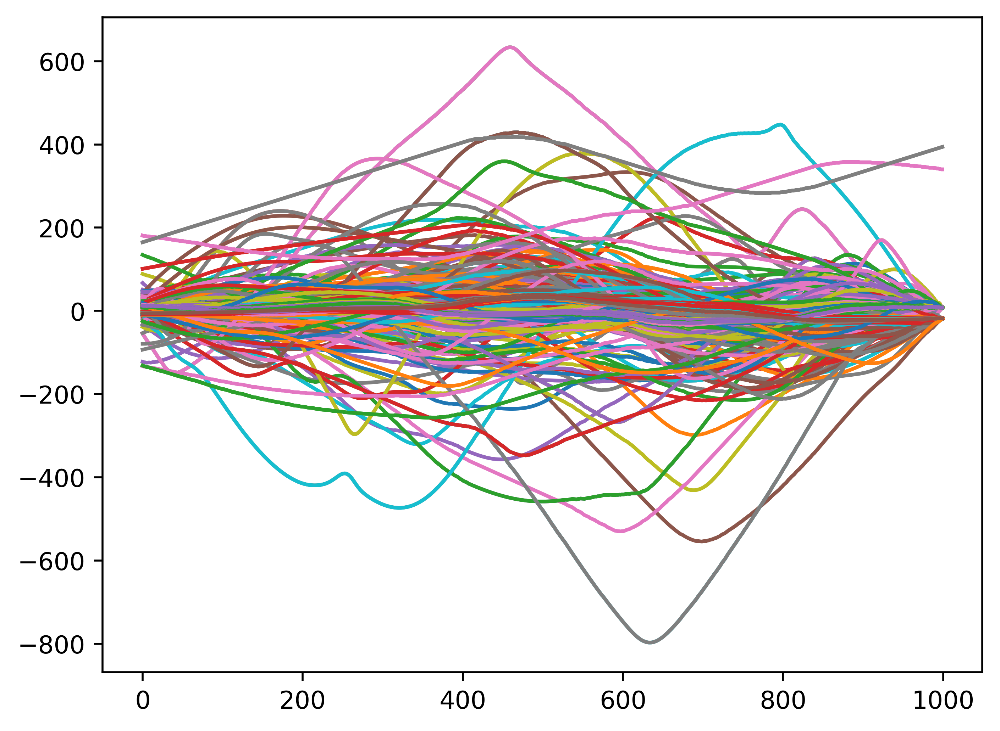

In [10]:
samples_runs = 50
# this will define the computational time

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])
sampler.run_mcmc(p0, samples_runs) 
samp = sampler.get_chain()

samp_reshaped = samp.reshape(samp.shape[0], -1) #so that the 3D array is reshaped as 2D, to save it 
np.savetxt('samples_emcee.txt',samp_reshaped, delimiter=',')

In [11]:
sampsubset = samp[0:samples_runs,:,:]
samp2d = sampsubset.reshape(sampsubset.shape[0]*sampsubset.shape[1],3)
samp2d.shape
samp2d

np.savetxt('bend4data.txt', np.c_[samp2d])    #year.bend

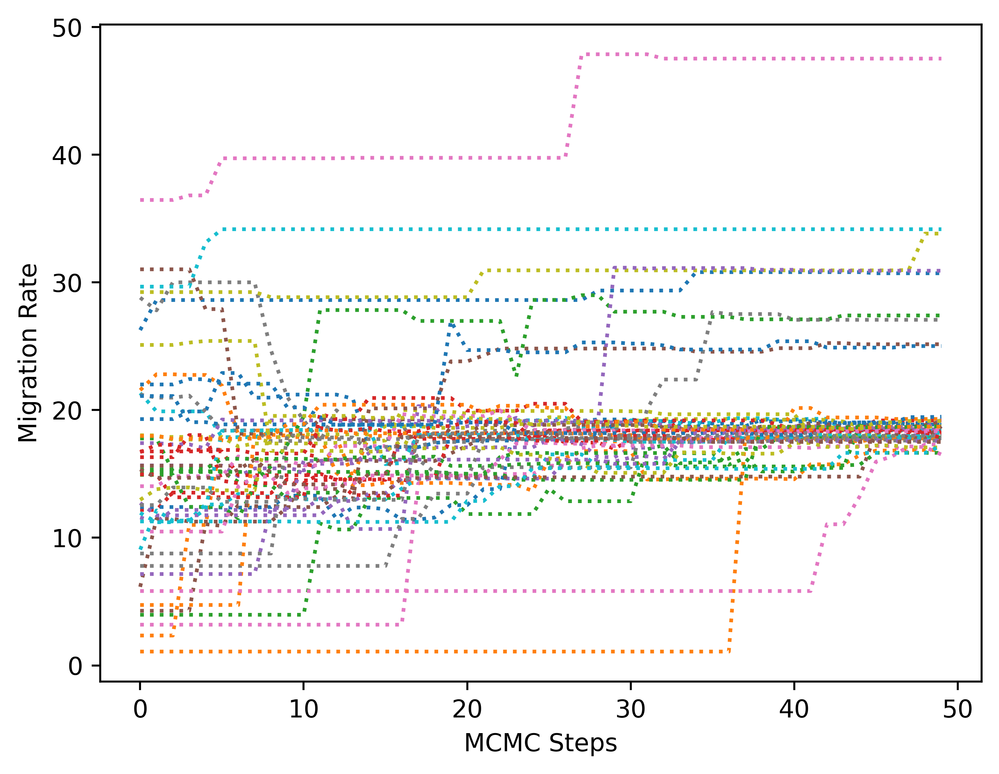

In [12]:
plt.plot(sampler.chain[:,:,0].T, ':')
plt.ylabel("Migration Rate",color='black')
plt.xlabel("MCMC Steps",color='black')


plt.savefig('migrations.PNG',dpi = 200)

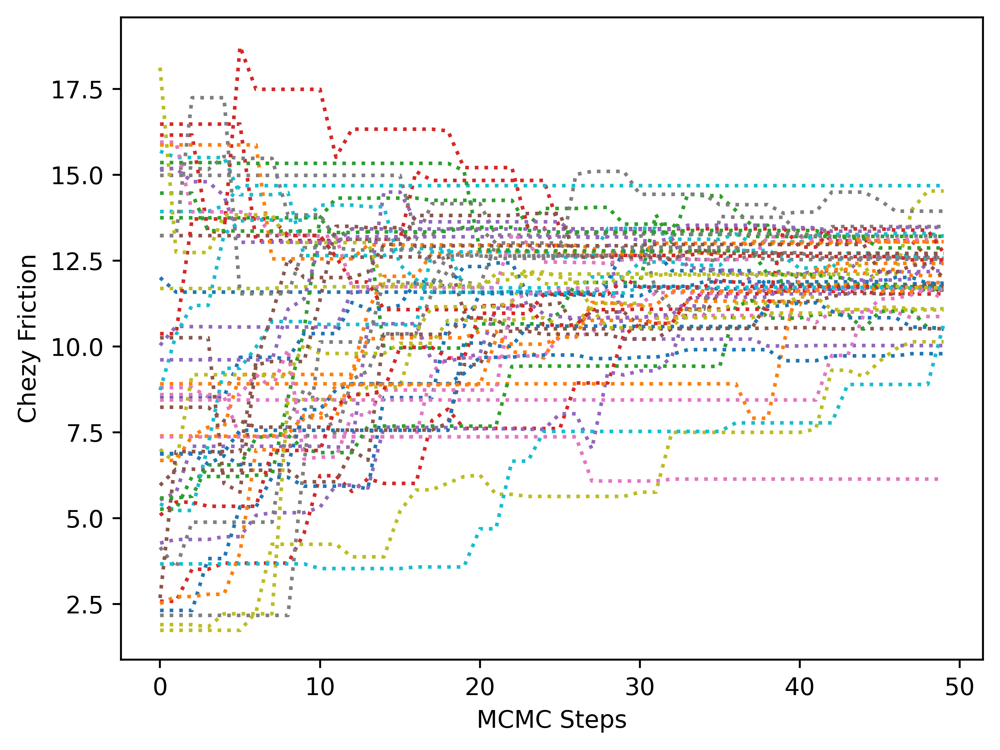

In [13]:
plt.plot(sampler.chain[:,:,1].T, ':')
plt.ylabel("Chezy Friction",color='black')
plt.xlabel("MCMC Steps",color='black')
plt.savefig('migrations.PNG',dpi = 200)

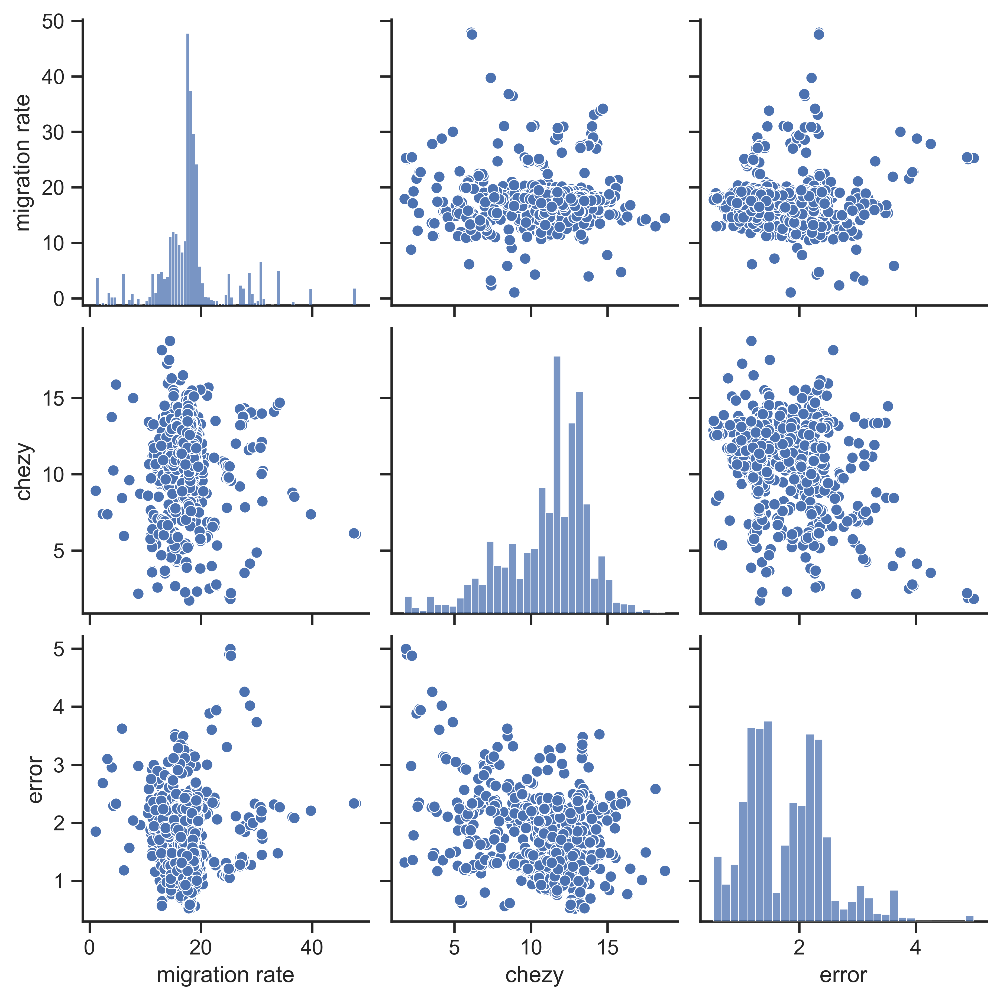

In [14]:
plt.rcParams.update({'font.size': 22}) # must set in top

samp_df = pd.DataFrame(samp2d)
samp_df = samp_df.rename(columns={0: 'migration rate',  1: 'chezy', 2: 'error'})   

samp_df
sns.color_palette("mako")
sns.set(style="ticks")
b = sns.pairplot(samp_df)

plt.savefig('kde%s.PNG',dpi = 300)

100%|███████████████████████████████████████████| 50/50 [00:00<00:00, 82.05it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/3005550957.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/3005550957.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

621341
10657
8002


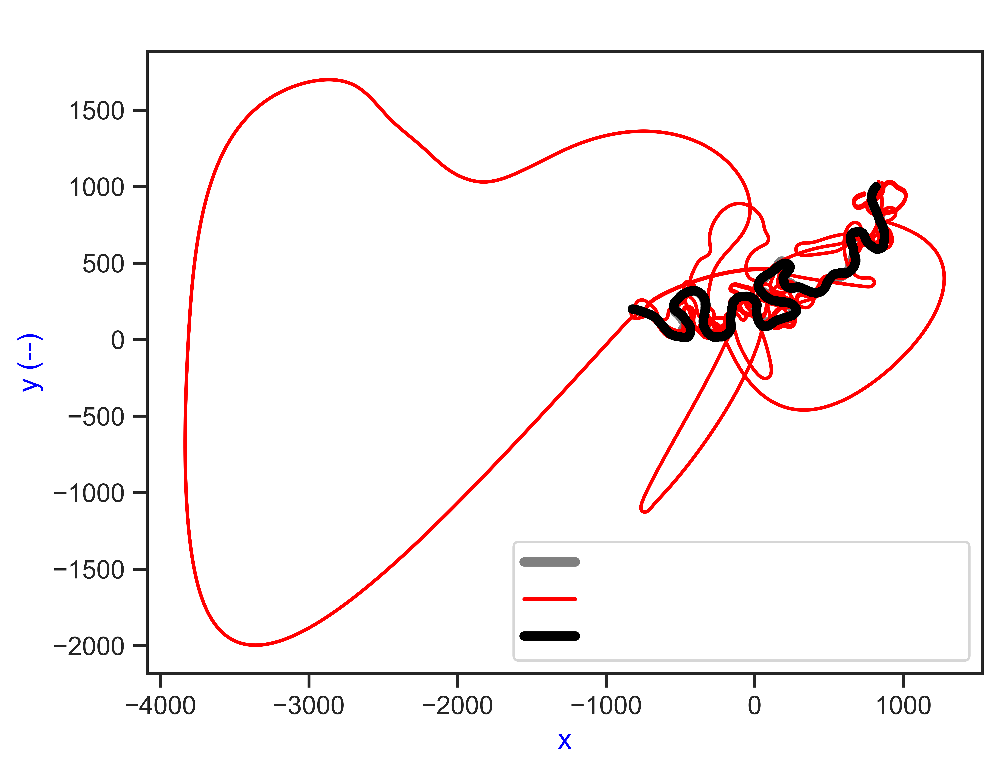

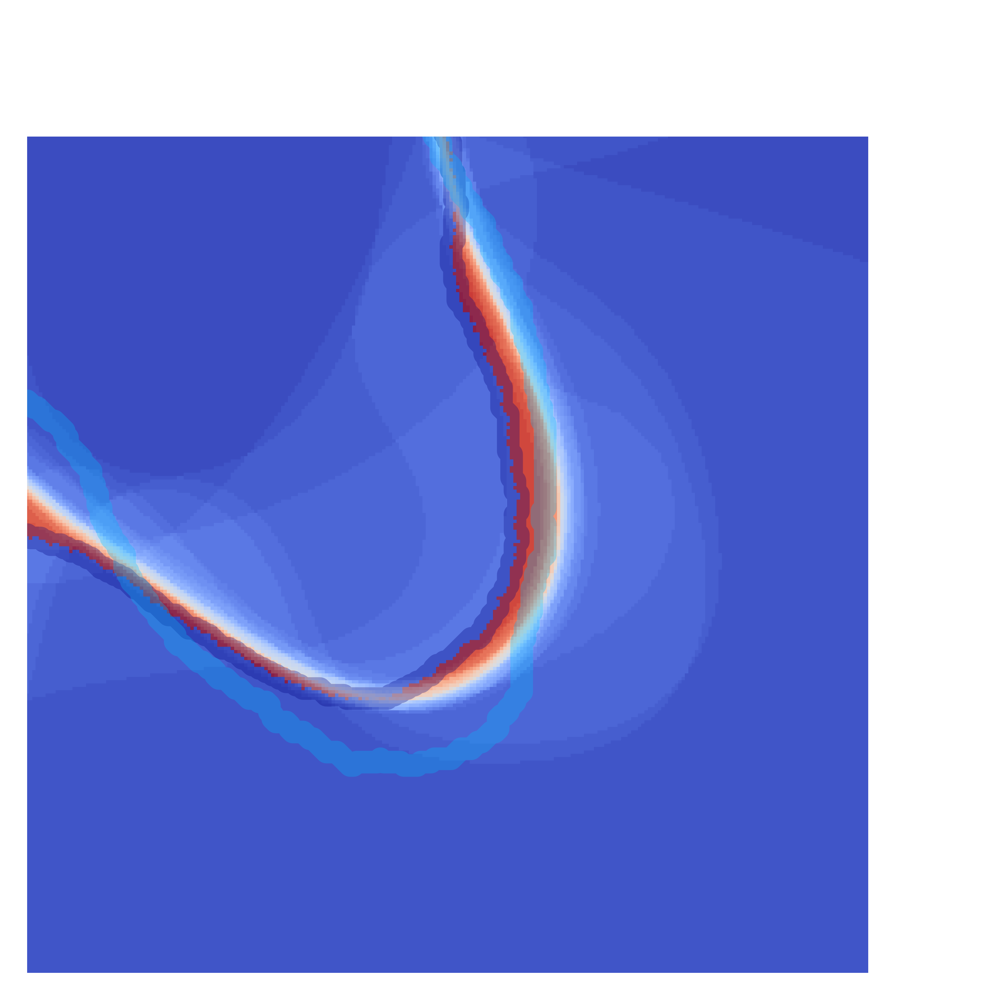

In [38]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL6.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 50                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([520, 770])
plt.ylim([330, 580])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 88.36it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/2466655034.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/2466655034.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

610857
10922
18221


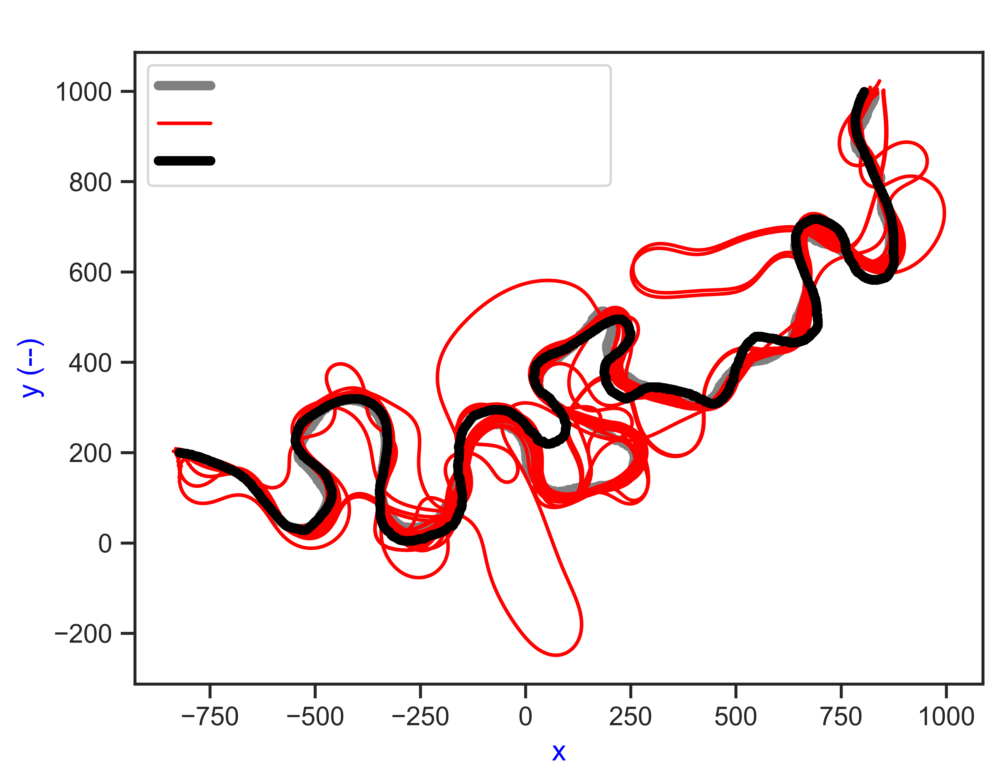

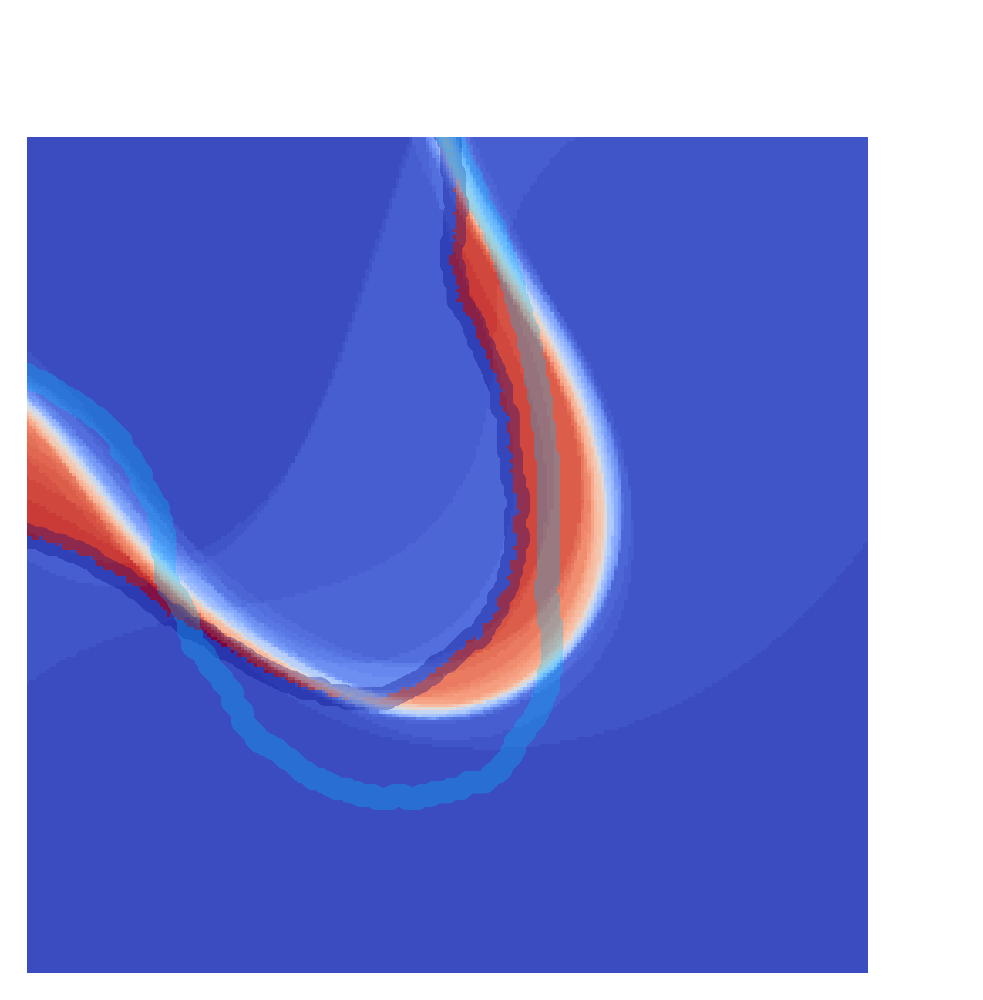

In [39]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL11.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 100                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([520, 770])
plt.ylim([330, 580])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 150/150 [00:01<00:00, 108.54it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/592037297.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/592037297.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

598586
12460
28954


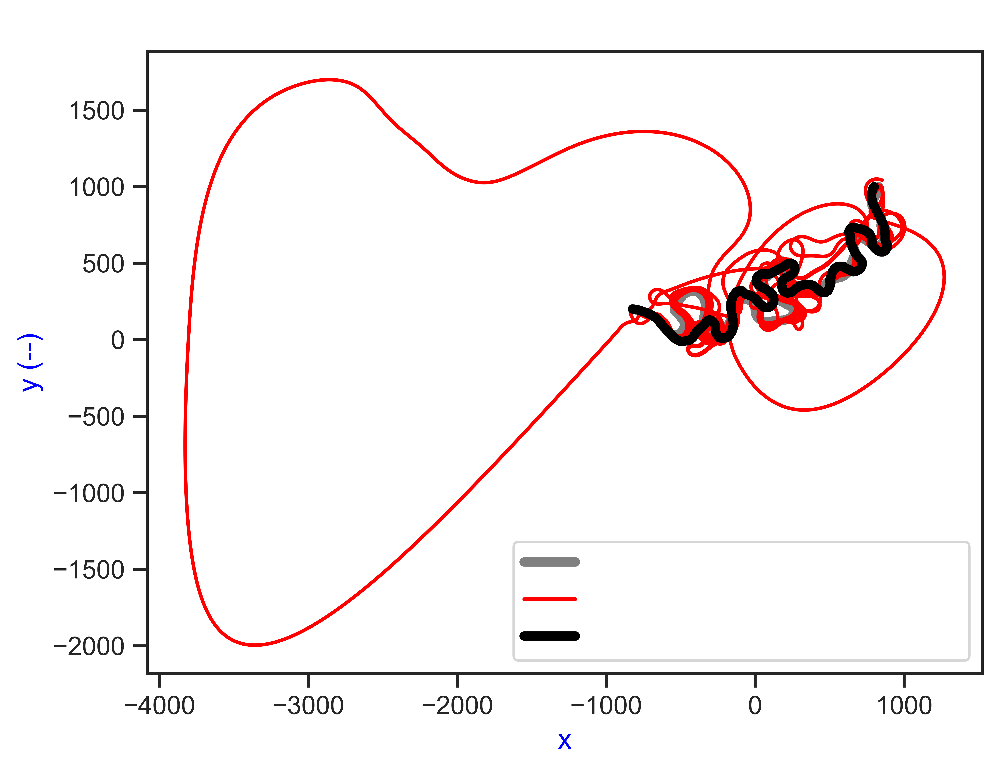

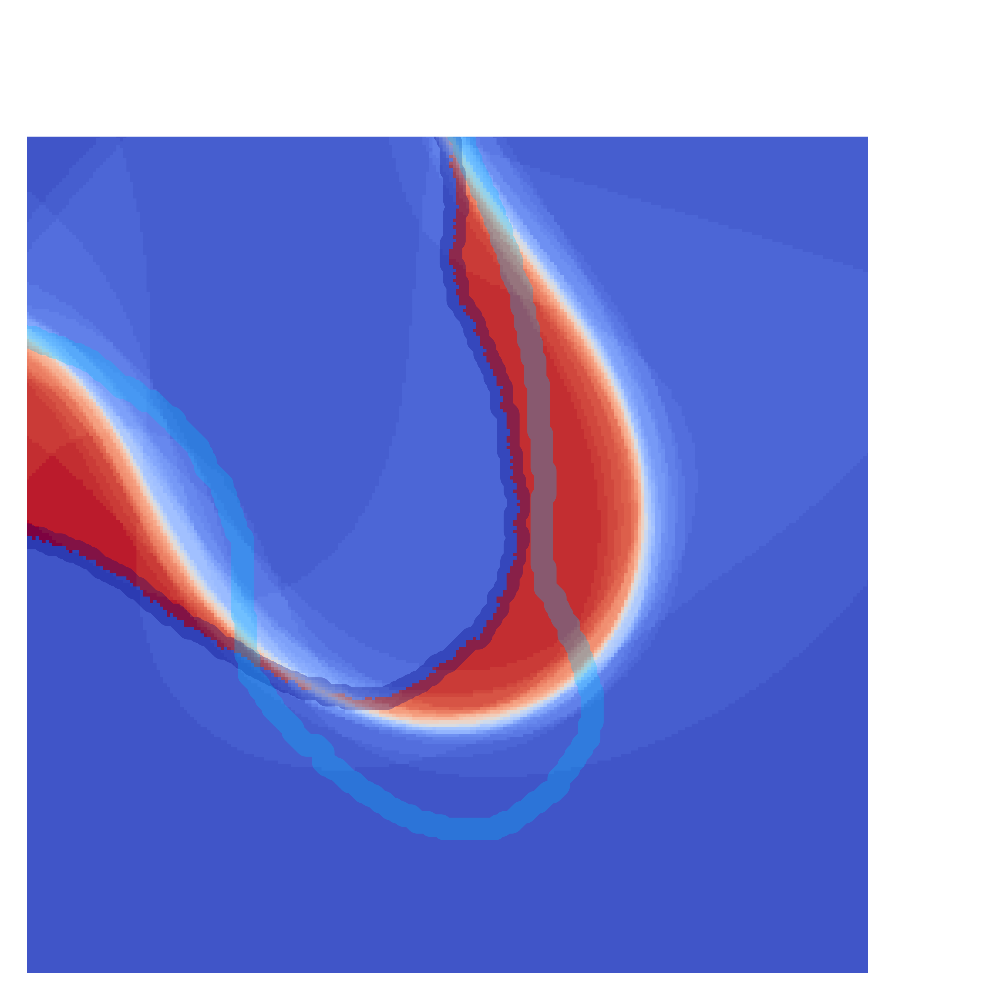

In [40]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL16.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 150                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([520, 770])
plt.ylim([330, 580])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 99.75it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/3789685335.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/3789685335.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

586365
15050
38585


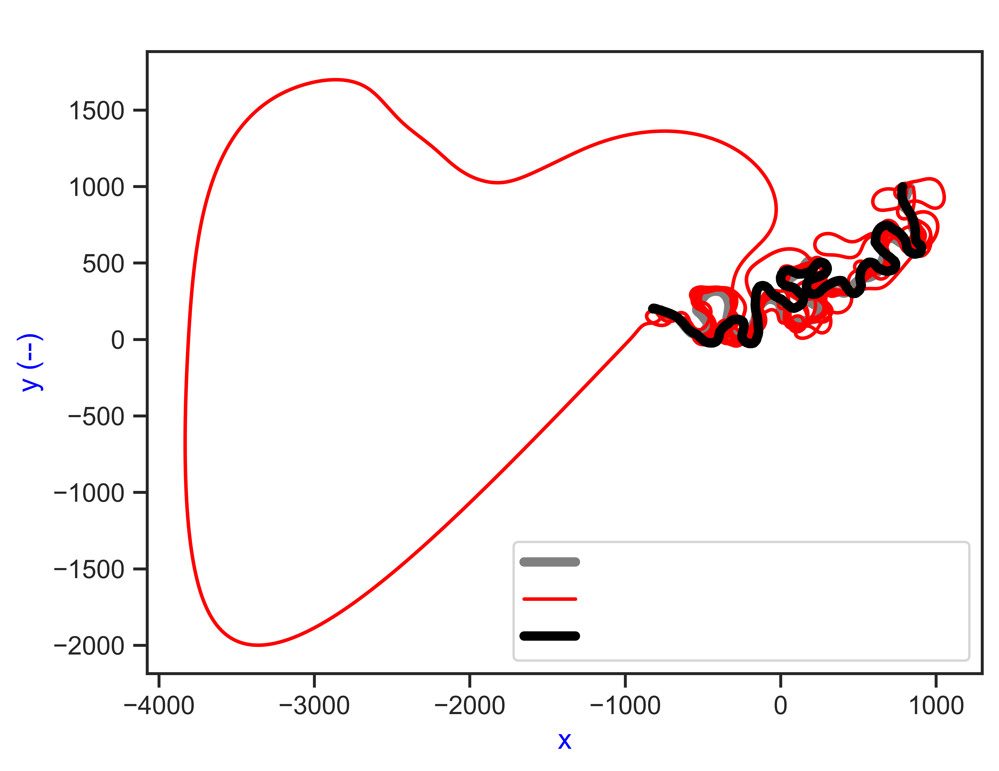

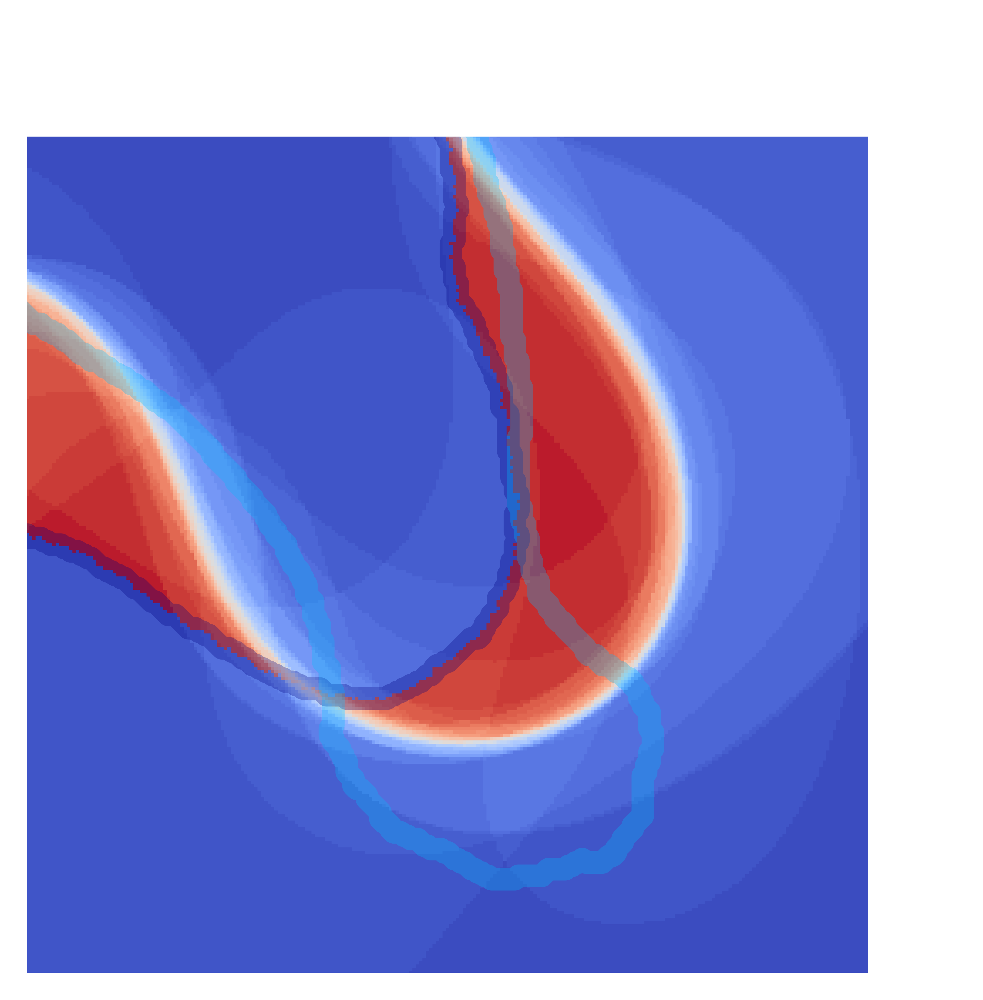

In [41]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL21.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 200                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([520, 770])
plt.ylim([330, 580])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 250/250 [00:02<00:00, 83.53it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/793665203.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/793665203.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

571917
27129
40954


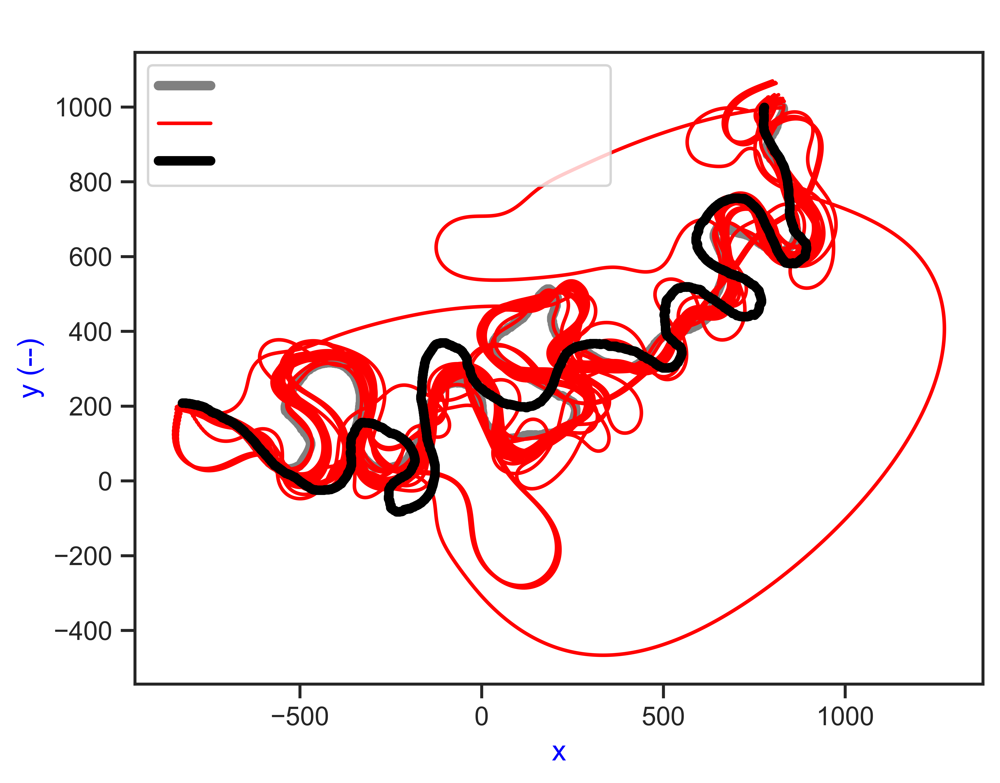

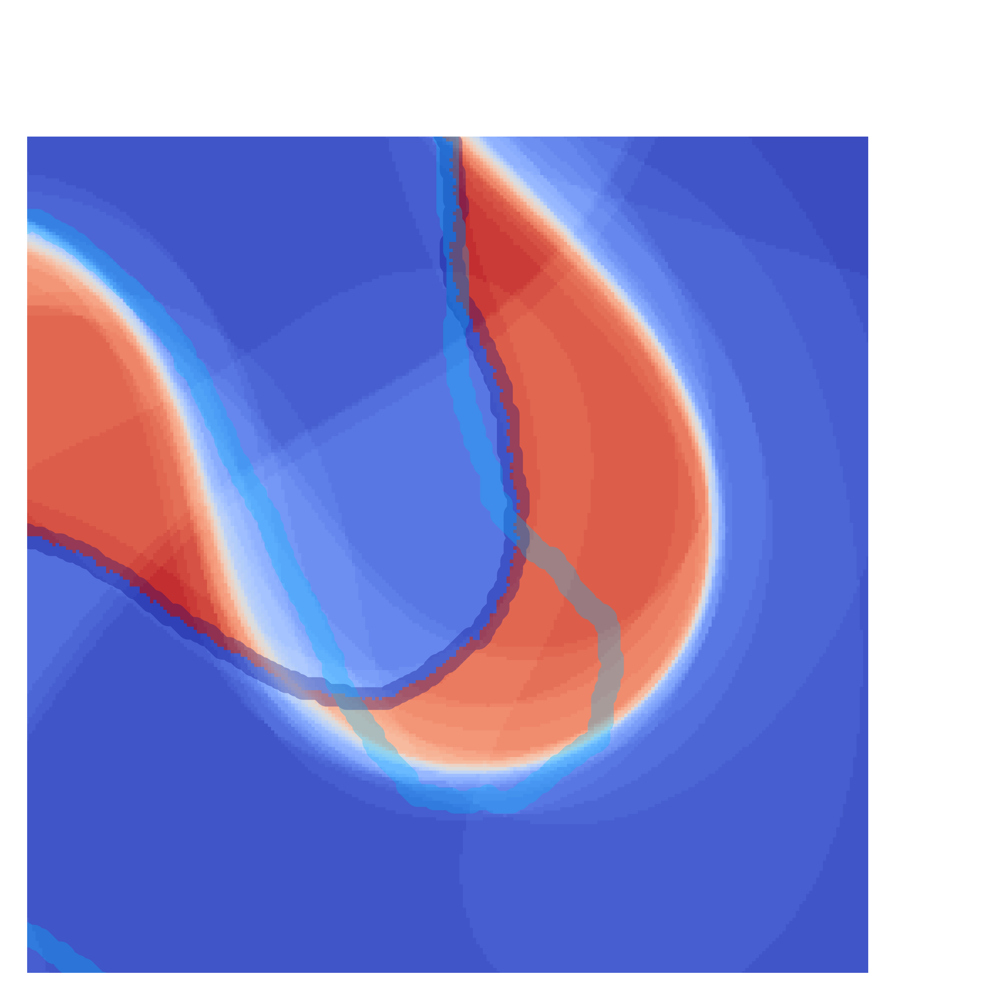

In [42]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL26.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 250                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([520, 770])
plt.ylim([330, 580])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 300/300 [00:02<00:00, 105.36it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/1429164449.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57321/1429164449.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

575063
19459
45478


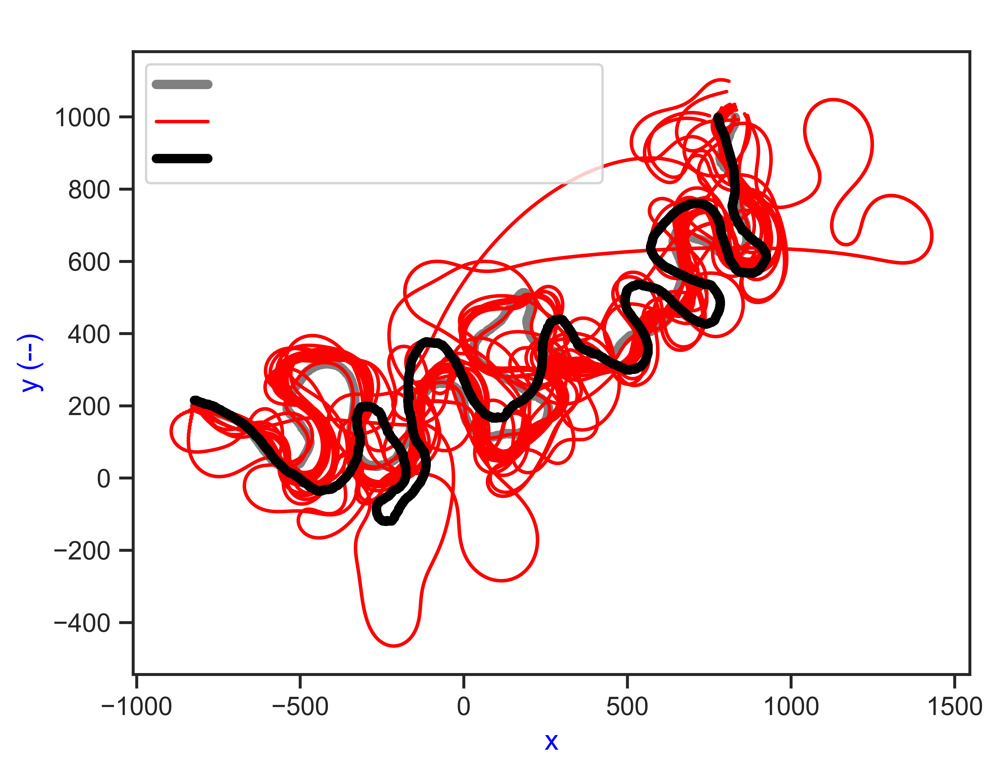

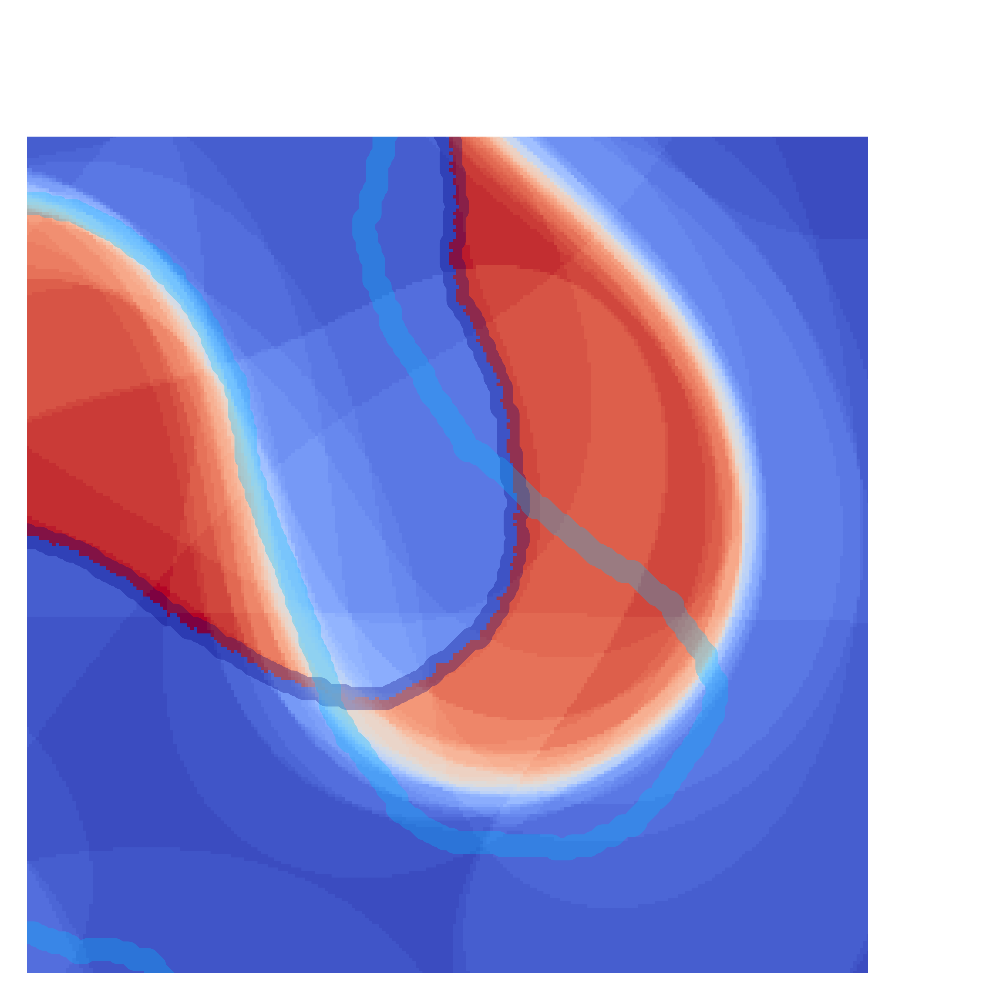

In [43]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend1")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL31.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 300                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([520, 770])
plt.ylim([330, 580])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)